##### the goal is here to see what exactly is happening in the wfd-depth outputs

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import os
import pandas as pd
%matplotlib inline

In [2]:
import time
import copy
import numpy as np
import healpy as hp
import os
import lsst.sims.maf.db as db
import lsst.sims.maf.metrics as metrics
import lsst.sims.maf.slicers as slicers
import lsst.sims.maf.metricBundles as metricBundles

import lsst.sims.maf.maps as maps

In [3]:
%matplotlib inline

In [4]:
fontsize = 18
rcparams = {}
rcparams['figure.figsize'] = (10, 6)
rcparams['axes.labelsize'] = fontsize
rcparams['legend.fontsize'] = fontsize-4
rcparams['axes.titlesize'] = fontsize
rcparams['axes.linewidth'] = 2
rcparams['axes.grid'] = True
for axis in ['x', 'y']:
    rcparams['%stick.labelsize'%axis] = fontsize-2
    rcparams['%stick.direction'%axis] = 'in'
    rcparams['%stick.major.size'%axis] = 5.5
    rcparams['%stick.minor.size'%axis] =  3.5
    rcparams['%stick.major.width'%axis] = 2
    rcparams['%stick.minor.width'%axis] = 1.5
rcparams['xtick.top'] = True
rcparams['ytick.right'] = True
for key in rcparams: mpl.rcParams[key] = rcparams[key]

##### set up the db names

In [5]:
dbdir = '/global/cscratch1/sd/awan/dbs_post_wp_v3'

print( ['%s' % f.split('.db')[0] for f in os.listdir(dbdir) if f.__contains__('wfd_depth') and f.__contains__('noddf') ] )
print( ['%s' % f.split('.db')[0] for f in os.listdir(dbdir) if f.__contains__('wfd_depth') and not f.__contains__('noddf') ] )

['wfd_depth_scale0.95_noddf_v1.4_10yrs', 'wfd_depth_scale0.80_noddf_v1.4_10yrs', 'wfd_depth_scale0.75_noddf_v1.4_10yrs', 'wfd_depth_scale0.70_noddf_v1.4_10yrs', 'wfd_depth_scale0.99_noddf_v1.4_10yrs', 'wfd_depth_scale0.90_noddf_v1.4_10yrs', 'wfd_depth_scale0.65_noddf_v1.4_10yrs', 'wfd_depth_scale0.85_noddf_v1.4_10yrs']
['wfd_depth_scale0.99_v1.4_10yrs', 'wfd_depth_scale0.65_v1.4_10yrs', 'wfd_depth_scale0.95_v1.4_10yrs', 'wfd_depth_scale0.75_v1.4_10yrs', 'wfd_depth_scale0.90_v1.4_10yrs', 'wfd_depth_scale0.80_v1.4_10yrs', 'wfd_depth_scale0.70_v1.4_10yrs', 'wfd_depth_scale0.85_v1.4_10yrs']


In [6]:
list(['%s' % f.split('.db')[0] for f in os.listdir(dbdir) if f.__contains__('wfd_depth') and f.__contains__('noddf') ])

['wfd_depth_scale0.95_noddf_v1.4_10yrs',
 'wfd_depth_scale0.80_noddf_v1.4_10yrs',
 'wfd_depth_scale0.75_noddf_v1.4_10yrs',
 'wfd_depth_scale0.70_noddf_v1.4_10yrs',
 'wfd_depth_scale0.99_noddf_v1.4_10yrs',
 'wfd_depth_scale0.90_noddf_v1.4_10yrs',
 'wfd_depth_scale0.65_noddf_v1.4_10yrs',
 'wfd_depth_scale0.85_noddf_v1.4_10yrs']

In [7]:
baseline_key = 'baseline_v1.4_10yrs'

dbnames = ['wfd_depth_scale%.2f_noddf_v1.4_10yrs' % f for f in np.arange(0.65, 0.99, 0.05)]

dbnames += ['wfd_depth_scale%.2f_noddf_v1.4_10yrs' % 0.99]

dbnames += [ baseline_key ]
dbnames

['wfd_depth_scale0.65_noddf_v1.4_10yrs',
 'wfd_depth_scale0.70_noddf_v1.4_10yrs',
 'wfd_depth_scale0.75_noddf_v1.4_10yrs',
 'wfd_depth_scale0.80_noddf_v1.4_10yrs',
 'wfd_depth_scale0.85_noddf_v1.4_10yrs',
 'wfd_depth_scale0.90_noddf_v1.4_10yrs',
 'wfd_depth_scale0.95_noddf_v1.4_10yrs',
 'wfd_depth_scale0.99_noddf_v1.4_10yrs',
 'baseline_v1.4_10yrs']

In [8]:
dbnames_base = dbnames.copy()

dbnames += ['wfd_depth_scale%.2f_v1.4_10yrs' % f for f in np.arange(0.65, 0.99, 0.05)]
dbnames += ['wfd_depth_scale%.2f_v1.4_10yrs' % 0.99]

In [9]:
dbnames_base, dbnames

(['wfd_depth_scale0.65_noddf_v1.4_10yrs',
  'wfd_depth_scale0.70_noddf_v1.4_10yrs',
  'wfd_depth_scale0.75_noddf_v1.4_10yrs',
  'wfd_depth_scale0.80_noddf_v1.4_10yrs',
  'wfd_depth_scale0.85_noddf_v1.4_10yrs',
  'wfd_depth_scale0.90_noddf_v1.4_10yrs',
  'wfd_depth_scale0.95_noddf_v1.4_10yrs',
  'wfd_depth_scale0.99_noddf_v1.4_10yrs',
  'baseline_v1.4_10yrs'],
 ['wfd_depth_scale0.65_noddf_v1.4_10yrs',
  'wfd_depth_scale0.70_noddf_v1.4_10yrs',
  'wfd_depth_scale0.75_noddf_v1.4_10yrs',
  'wfd_depth_scale0.80_noddf_v1.4_10yrs',
  'wfd_depth_scale0.85_noddf_v1.4_10yrs',
  'wfd_depth_scale0.90_noddf_v1.4_10yrs',
  'wfd_depth_scale0.95_noddf_v1.4_10yrs',
  'wfd_depth_scale0.99_noddf_v1.4_10yrs',
  'baseline_v1.4_10yrs',
  'wfd_depth_scale0.65_v1.4_10yrs',
  'wfd_depth_scale0.70_v1.4_10yrs',
  'wfd_depth_scale0.75_v1.4_10yrs',
  'wfd_depth_scale0.80_v1.4_10yrs',
  'wfd_depth_scale0.85_v1.4_10yrs',
  'wfd_depth_scale0.90_v1.4_10yrs',
  'wfd_depth_scale0.95_v1.4_10yrs',
  'wfd_depth_scale0.99_v1

#### read in the depth data in eg-footprints

In [10]:
depth_dir = '/global/cscratch1/sd/awan/lsst_output/post_wp_output_v1.4_-0.1cuts/bundle_data/'
ilim = 25.9

depth_bundles = {}

for dbname in dbnames:
    file = [f for f in os.listdir(depth_dir) if f.__contains__('depth_in_eg_%s' % dbname) and \
                f.__contains__('limi%s' % ilim)
               ]
    print(file)
    
    depth_bundles[dbname] = metricBundles.createEmptyMetricBundle()
    depth_bundles[dbname].read('%s/%s' % (depth_dir, file[0]))

['depth_in_eg_wfd_depth_scale0.65_noddf_v1.4_10yrs_i-band_limi25.9_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.70_noddf_v1.4_10yrs_i-band_limi25.9_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.75_noddf_v1.4_10yrs_i-band_limi25.9_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.80_noddf_v1.4_10yrs_i-band_limi25.9_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.85_noddf_v1.4_10yrs_i-band_limi25.9_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.90_noddf_v1.4_10yrs_i-band_limi25.9_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminute

In [11]:
area_ppixel = hp.nside2pixarea(nside=256, degrees=True)

In [12]:
def plot_things(bundle, tag, area_df=None, colormin=None, colormax=None):

    if area_df is None:
        area_df = pd.DataFrame()
        add_to_df = False
    else:
        add_to_df = True
        
    #to_print1 = ''
    #to_print2 = ''
    dbs_list_noddf_ = []
    dbs_list_wddf_ = []
    areas_noddf_ = []
    areas_wddf_ = []
    
    for i, dbname in enumerate( [f for f in dbnames_base if not f.__contains__('baseline')] ):

        plt.clf()
        fig, axes = plt.subplots(1,3)

        # color scale based on the baseline
        in_survey_pixels = np.where( bundle[baseline_key].metricValues.mask == False )[0]
        # find the color range
        median = np.median(bundle[baseline_key].metricValues.data[in_survey_pixels])
        stddev = np.std(bundle[baseline_key].metricValues.data[in_survey_pixels])

        if colormin is None:
            colormin = median - 1.5 * stddev
        if colormax is None:
            colormax = median + 1.5 * stddev
        nticks = 10 # 5

        # baseline
        title = '%s\n%.2f deg2' % (baseline_key, len(in_survey_pixels) * area_ppixel)
        if i == 0:
            dbs_list_wddf_.append(baseline_key)
            areas_wddf_.append( len(in_survey_pixels) * area_ppixel)
        
        plt.axes(axes[0])
        hp.mollview(bundle[baseline_key].metricValues, flip='astro', rot=(0,0,0),
                    min=colormin, max=colormax, hold=True,
                    cbar=False, title=title)
        hp.graticule(dpar=20, dmer=20, verbose=False)


        # now plot noddf
        in_survey_pixels = np.where( bundle[dbname].metricValues.mask == False )[0]
        title = '%s\n%.2f deg2' % (dbname, len(in_survey_pixels) * area_ppixel)
        #to_print1 += '%s | %.2f deg2\n' % (dbname, len(in_survey_pixels) * area_ppixel)
        plt.axes(axes[1])
        hp.mollview(bundle[dbname].metricValues, flip='astro', rot=(0,0,0),
                    min=colormin, max=colormax, hold=True,
                    cbar=False, title=title)
        hp.graticule(dpar=20, dmer=20, verbose=False)
        dbs_list_noddf_.append(dbname)
        areas_noddf_.append( len(in_survey_pixels) * area_ppixel)
            

        # plot the on wddf
        plt.axes(axes[2])
        dbname = dbname.replace('_noddf', '')
        in_survey_pixels = np.where( bundle[dbname].metricValues.mask == False )[0]
        title = '%s\n%.2f deg2' % (dbname, len(in_survey_pixels) * area_ppixel)
        #to_print2 += '%s | %.2f deg2\n' % (dbname, len(in_survey_pixels) * area_ppixel)
        hp.mollview(bundle[dbname].metricValues, flip='astro', rot=(0,0,0),
                    min=colormin, max=colormax, hold=True,
                    cbar=False, title=title)
        hp.graticule(dpar=20, dmer=20, verbose=False)
        dbs_list_wddf_.append(dbname)
        areas_wddf_.append( len(in_survey_pixels) * area_ppixel)

        # set up the color bar
        increment = (colormax - colormin) / float(nticks)
        ticks = np.arange(colormin + increment, colormax, increment)

        ax = plt.gca()
        im = ax.get_images()[0]
        fig = plt.gcf()
        cbaxes = fig.add_axes([0.25, 0.38, 0.5, 0.01]) # [left, bottom, width, height]
        cb = plt.colorbar(im, orientation='horizontal',
                          ticks=ticks, format='%.2f', cax=cbaxes
                         )
        cb.set_label( 'i-band depth' )
        fig.set_size_inches(20, 15)
        plt.show()
        
    if not add_to_df:
        area_df['dbname'] = dbs_list_wddf_ + dbs_list_noddf_
        
    area_df[tag] = areas_wddf_ + areas_noddf_
        
    #return to_print1, to_print2, area_df
    return area_df

/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2020_05/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/matplotlib/pyplot.py:880: MatplotlibDeprecationWarning: 
Using pyplot.axes(ax) with ax an Axes argument is deprecated. Please use pyplot.sca(ax) instead.
  message="Using pyplot.axes(ax) with ax an Axes "


<Figure size 720x432 with 0 Axes>

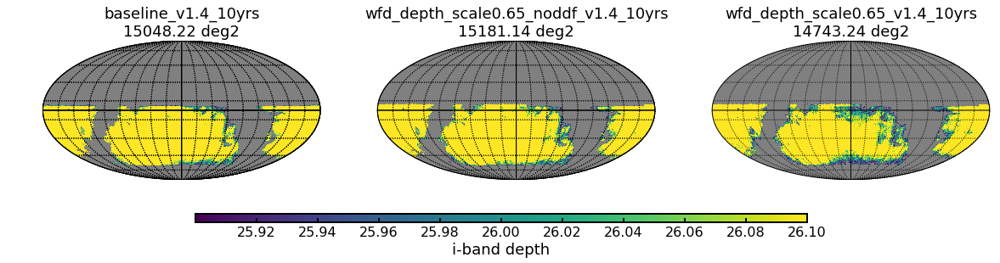

<Figure size 720x432 with 0 Axes>

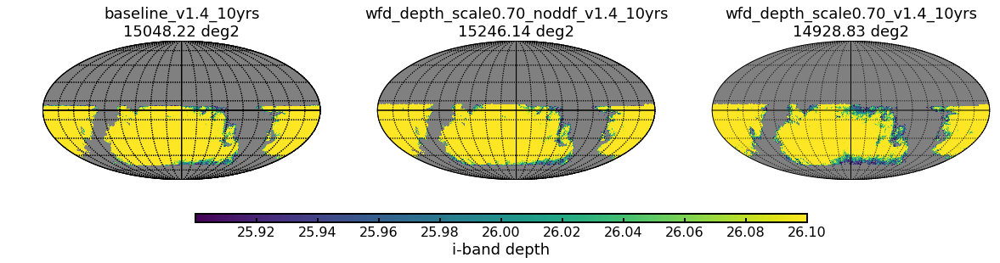

<Figure size 720x432 with 0 Axes>

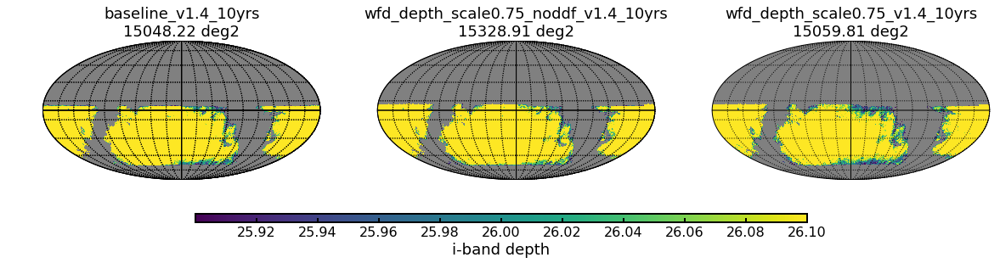

<Figure size 720x432 with 0 Axes>

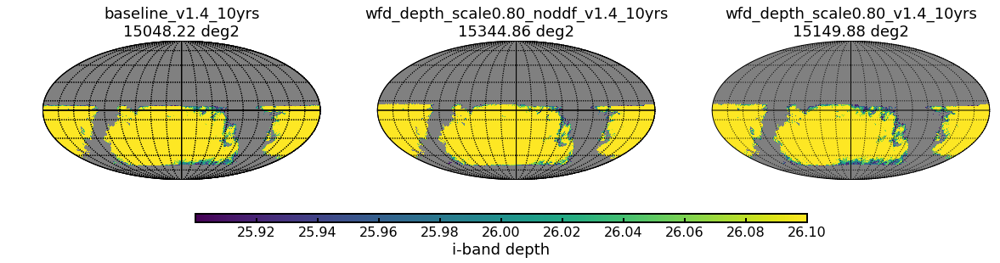

<Figure size 720x432 with 0 Axes>

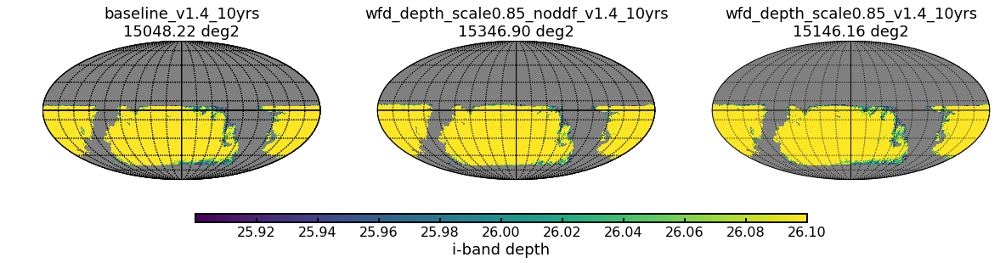

<Figure size 720x432 with 0 Axes>

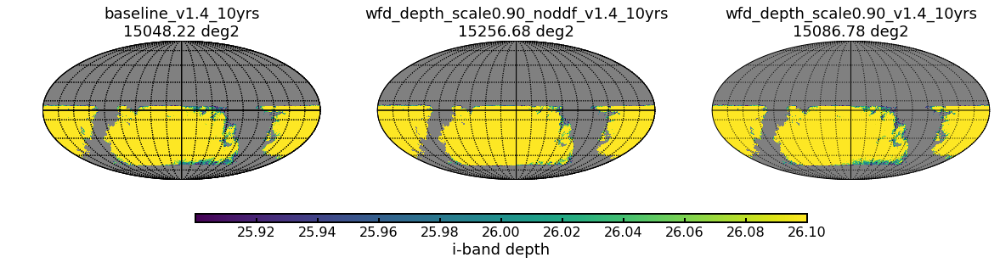

<Figure size 720x432 with 0 Axes>

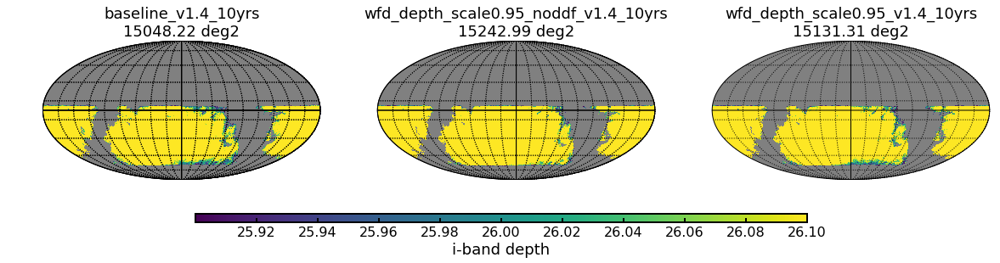

<Figure size 720x432 with 0 Axes>

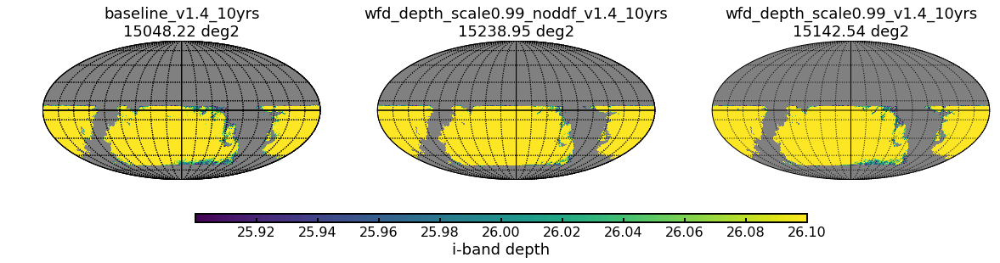

In [13]:
areas_dict = plot_things(bundle=depth_bundles, tag='eg', area_df=None, colormin=25.9, colormax=26.1)

lets plot some distributions

In [14]:
min_all, max_all = 1000, -1000
for dbname in dbnames:

    in_survey_pixels = np.where( depth_bundles[dbname].metricValues.mask == False )[0]
    min_all = min( [ min_all, min(depth_bundles[dbname].metricValues.data[in_survey_pixels]) ])
    
    max_all = max( [ max_all, max(depth_bundles[dbname].metricValues.data[in_survey_pixels]) ])
    
print(min_all, max_all)

25.900000649023248 26.685851111975968


In [15]:
from matplotlib import cm
colors = [cm.viridis(i) for i in np.arange(0, 255, int(255/(len(dbnames_base)-1)))]
colors.reverse()

<Figure size 720x432 with 0 Axes>

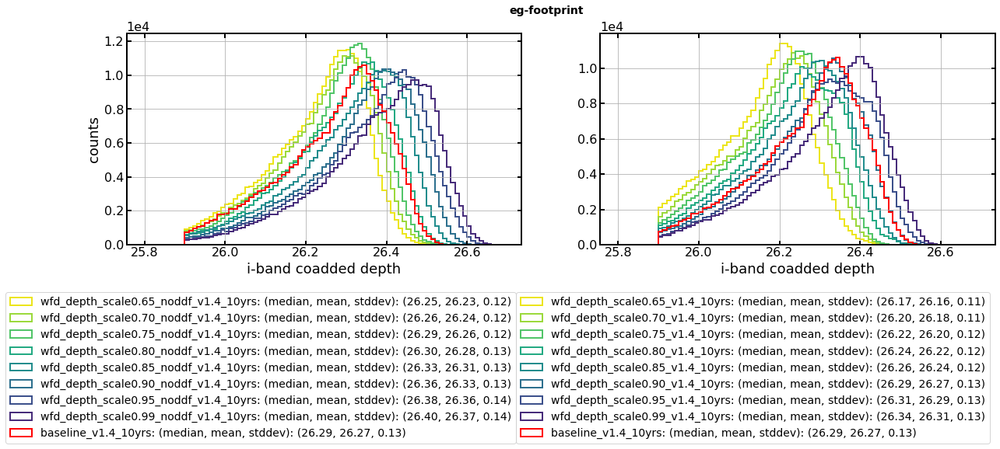

In [16]:
bins = np.arange(25.8, 26.7, 0.01)

plt.clf()
fig, axes = plt.subplots(1,2)

for i, dbname in enumerate( [f for f in dbnames_base if not f.__contains__('baseline')] ):

    in_survey_pixels = np.where( depth_bundles[dbname].metricValues.mask == False )[0]
    
    median = np.median(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    mean = np.mean(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    stddev = np.std(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    label = '%s: (median, mean, stddev): (%.2f, %.2f, %.2f)' % (dbname, median, mean, stddev)

    out = axes[0].hist( list(depth_bundles[dbname].metricValues.data[in_survey_pixels]), color=colors[i], label=label, histtype='step', lw=2, bins=bins)
    
    # no dff
    dbname = dbname.replace('_noddf', '')
    in_survey_pixels = np.where( depth_bundles[dbname].metricValues.mask == False )[0]
    
    median = np.median(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    mean = np.mean(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    stddev = np.std(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    label = '%s: (median, mean, stddev): (%.2f, %.2f, %.2f)' % (dbname, median, mean, stddev)
    
    axes[1].hist( list(depth_bundles[dbname].metricValues.data[in_survey_pixels]), color=colors[i], label=label, histtype='step', lw=2, bins=bins)

for ax in axes:
    dbname = baseline_key
    in_survey_pixels = np.where( depth_bundles[dbname].metricValues.mask == False )[0]
    
    median = np.median(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    mean = np.mean(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    stddev = np.std(depth_bundles[dbname].metricValues.data[in_survey_pixels])
    label = '%s: (median, mean, stddev): (%.2f, %.2f, %.2f)' % (dbname, median, mean, stddev)
    
    ax.hist( list(depth_bundles[dbname].metricValues.data[in_survey_pixels]), color='r', label=label, histtype='step', lw=2, bins=bins)
    
    ax.set_xlabel('i-band coadded depth')
    
    ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
    
axes[0].set_ylabel('counts')
axes[0].legend(bbox_to_anchor = (1, -0.2))
axes[1].legend(bbox_to_anchor = (1, -0.2))
plt.suptitle('eg-footprint', fontweight="bold", fontsize=14)
fig.set_size_inches(20, 5)
plt.show()

okay more time spent on WFD leads to a deeper survey - makes sense.

#### now implement a declination cut on the skymaps
so that all wfd-depth outputs have the same dec-cut as the baseline

In [17]:
def pix2radec(nside, pix_num):
    """
    
    Given the pixel number / sliceID, return the RA/Dec of the pointing, in degrees.
    
    """
    # Calculate RA/Dec in radians of pixel in this healpix slicer.
    # Note that ipix could be an array,
    # in which case RA/Dec values will be an array also.
    lat, ra = hp.pix2ang(nside, pix_num)
    # Move dec to +/- 90 degrees
    dec = np.pi/2.0 - lat
    return np.rad2deg(ra), np.rad2deg(dec)

In [18]:
nside = 256

In [19]:
# baseline
eg = np.where( (depth_bundles[baseline_key].metricValues.mask == False) )[0]
eg_ras, eg_decs = pix2radec(nside=nside, pix_num=eg)
min_dec_baseline, max_dec_baseline = min(eg_decs), max(eg_decs)
    
print('baseline: %.2f <= dec <= %.2f' % (min_dec_baseline, max_dec_baseline))

baseline: -63.82 <= dec <= 6.13


In [20]:
for dbname in [f for f in dbnames_base if not f.__contains__('baseline')]:
    
    # wfd-depth wo ddf
    in_survey_pixels = np.where( (depth_bundles[dbname].metricValues.mask == False) )[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_baseline) & (in_survey_decs >= min_dec_baseline) )[0] ]
    
    depth_bundles[dbname].metricValues.mask[:] = True
    depth_bundles[dbname].metricValues.mask[wfd_pixels] = False
    
    # wfd-depth w/ ddf
    dbname = dbname.replace('_noddf', '')
    
    in_survey_pixels = np.where( (depth_bundles[dbname].metricValues.mask == False))[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_baseline) & (in_survey_decs >= min_dec_baseline) )[0] ]
    
    depth_bundles[dbname].metricValues.mask[:] = True
    depth_bundles[dbname].metricValues.mask[wfd_pixels] = False
    

<Figure size 720x432 with 0 Axes>

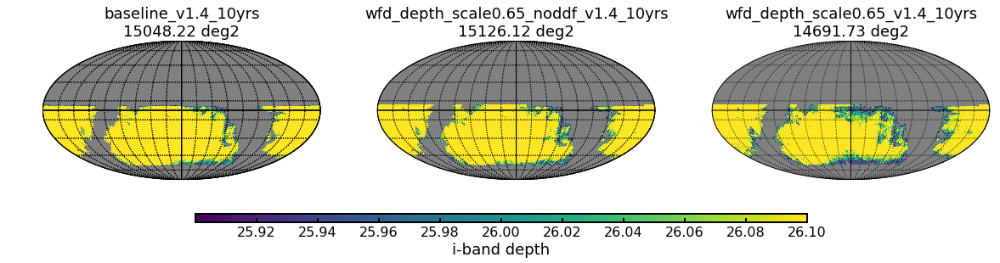

<Figure size 720x432 with 0 Axes>

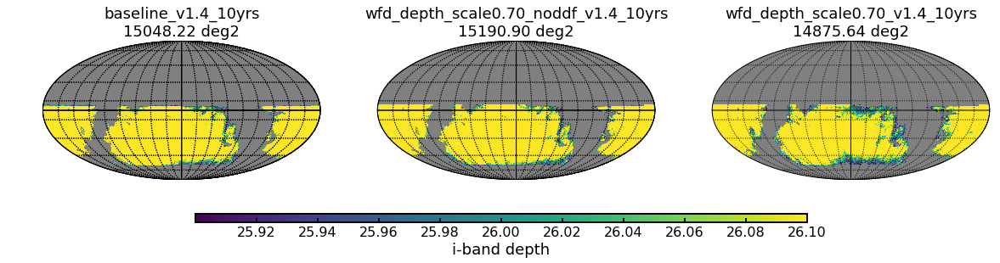

<Figure size 720x432 with 0 Axes>

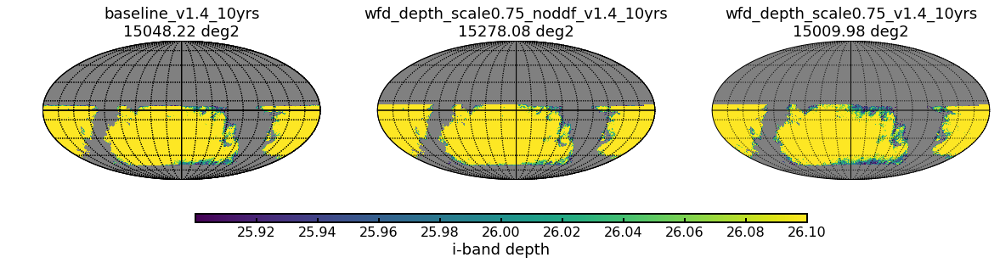

<Figure size 720x432 with 0 Axes>

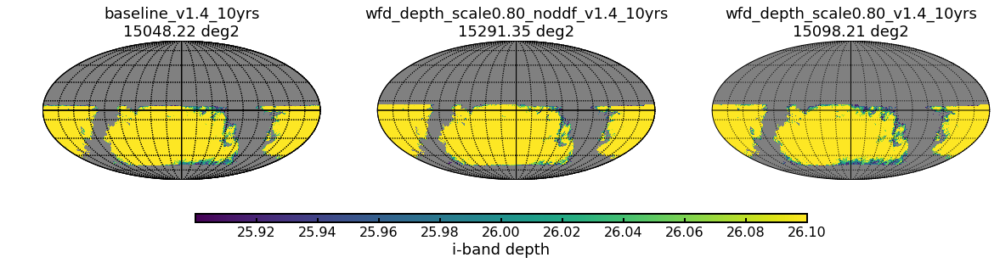

<Figure size 720x432 with 0 Axes>

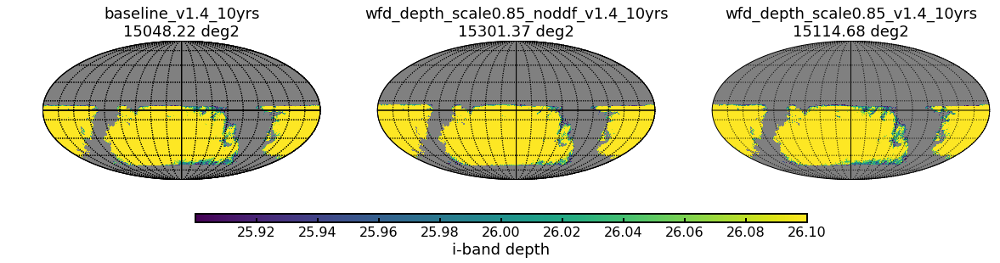

<Figure size 720x432 with 0 Axes>

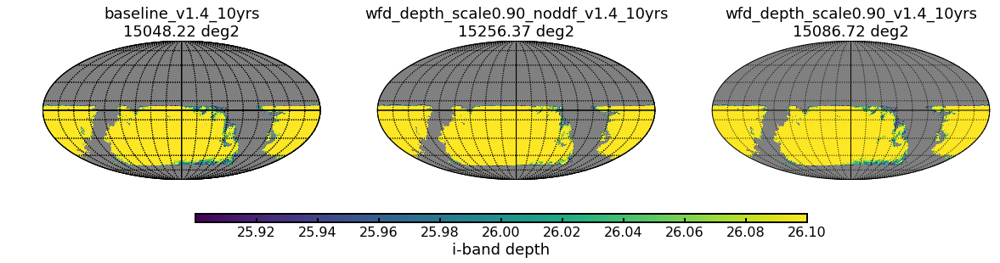

<Figure size 720x432 with 0 Axes>

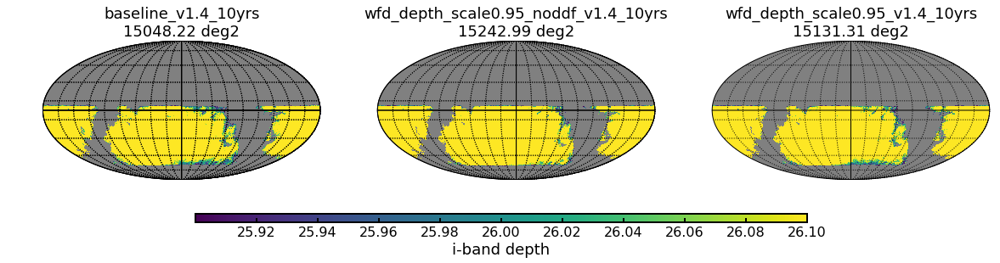

<Figure size 720x432 with 0 Axes>

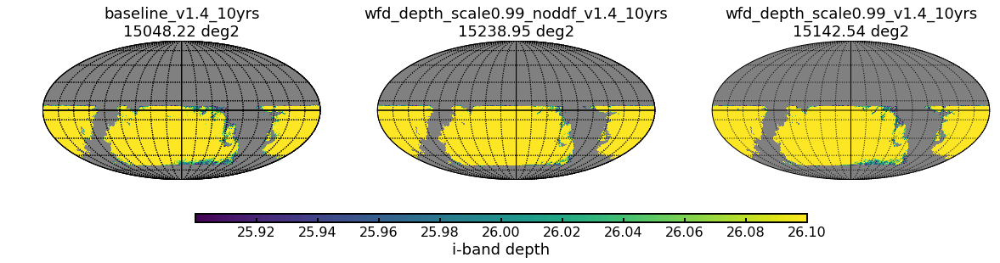

In [21]:
areas_dict = plot_things(bundle=depth_bundles, tag='eg + dec-cuts', area_df=areas_dict, colormin=25.9, colormax=26.1)

In [22]:
print('survey area')
areas_dict

survey area


,dbname,eg,eg + dec-cuts
0,baseline_v1.4_10yrs,15048.220324,15048.220324
1,wfd_depth_scale0.65_v1.4_10yrs,14743.241995,14691.730348
2,wfd_depth_scale0.70_v1.4_10yrs,14928.830802,14875.640568
3,wfd_depth_scale0.75_v1.4_10yrs,15059.813067,15009.980007
4,wfd_depth_scale0.80_v1.4_10yrs,15149.879766,15098.210751
5,wfd_depth_scale0.85_v1.4_10yrs,15146.155401,15114.681889
6,wfd_depth_scale0.90_v1.4_10yrs,15086.775375,15086.722919
7,wfd_depth_scale0.95_v1.4_10yrs,15131.310394,15131.310394
8,wfd_depth_scale0.99_v1.4_10yrs,15142.535947,15142.535947
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,15181.143455,15126.117265


okay there "turnover" shifts from scale0.65 to scale0.90 when we implement a declination cut.

### read in coadded depth maps for all non-dd survey area.

In [23]:
depth_dir = '/global/cscratch1/sd/awan/lsst_output/post_wp_output_v1.4_-0.1cuts/exgalm5_data/bundle_data/'
exgal_depth_bundles = {}

for dbname in dbnames:
    file = [f for f in os.listdir(depth_dir) if f.__contains__('exgal-depth-non-dd_%s' % dbname) and \
                f.__contains__('i-band')
               ]
    print(file)
    
    exgal_depth_bundles[dbname] = metricBundles.createEmptyMetricBundle()
    exgal_depth_bundles[dbname].read('%s/%s' % (depth_dir, file[0]))

['exgal-depth-non-dd_wfd_depth_scale0.65_noddf_v1.4_10yrs_i-band_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['exgal-depth-non-dd_wfd_depth_scale0.70_noddf_v1.4_10yrs_i-band_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['exgal-depth-non-dd_wfd_depth_scale0.75_noddf_v1.4_10yrs_i-band_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['exgal-depth-non-dd_wfd_depth_scale0.80_noddf_v1.4_10yrs_i-band_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['exgal-depth-non-dd_wfd_depth_scale0.85_noddf_v1.4_10yrs_i-band_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['exgal-depth-non-dd_wfd_depth_scale0.90_noddf_v1.4_10yrs_i-band_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['exgal-depth-non-dd_wfd_depth_scale0.95_noddf_v1.4_10yrs_i-band

<Figure size 720x432 with 0 Axes>

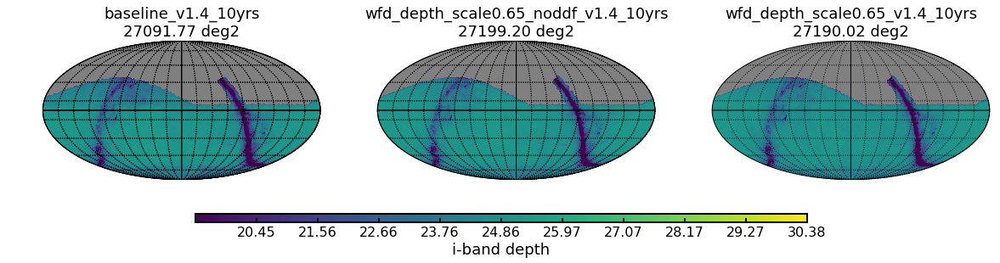

<Figure size 720x432 with 0 Axes>

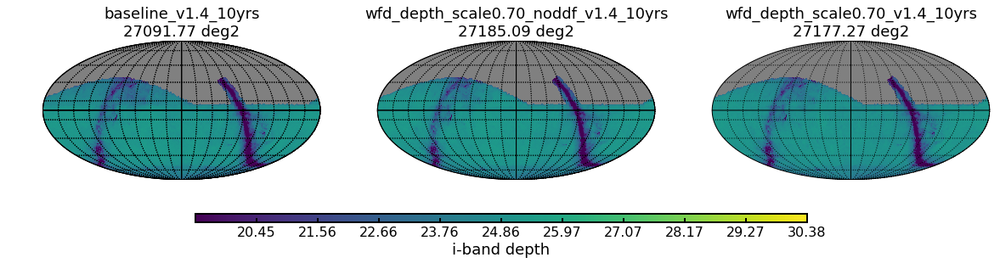

<Figure size 720x432 with 0 Axes>

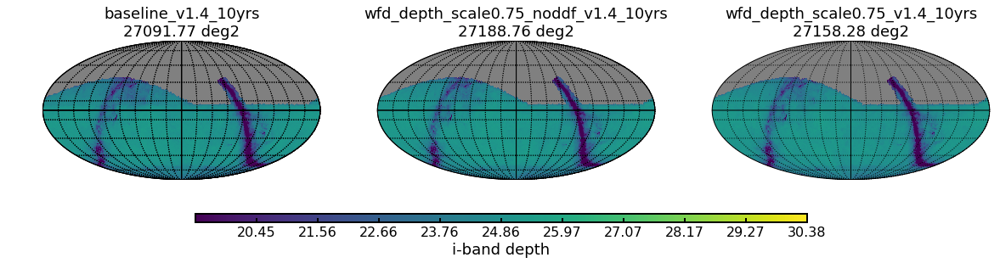

<Figure size 720x432 with 0 Axes>

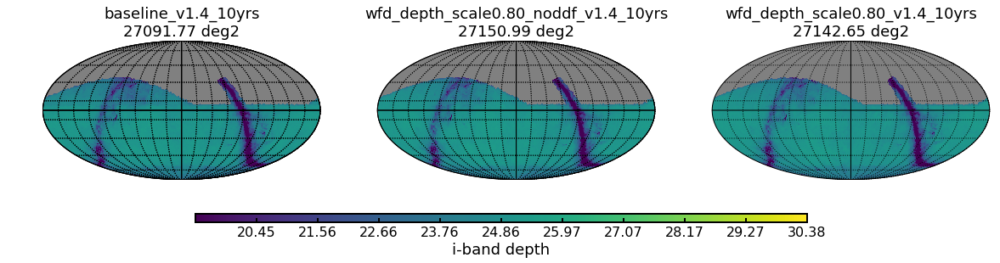

<Figure size 720x432 with 0 Axes>

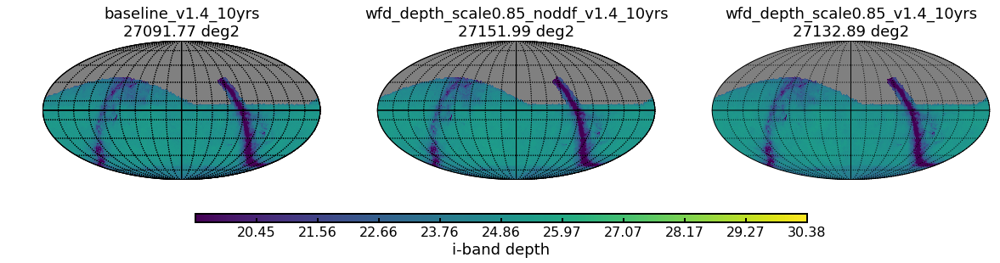

<Figure size 720x432 with 0 Axes>

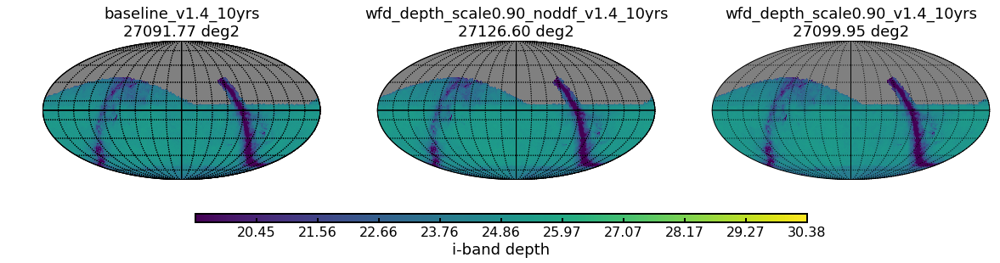

<Figure size 720x432 with 0 Axes>

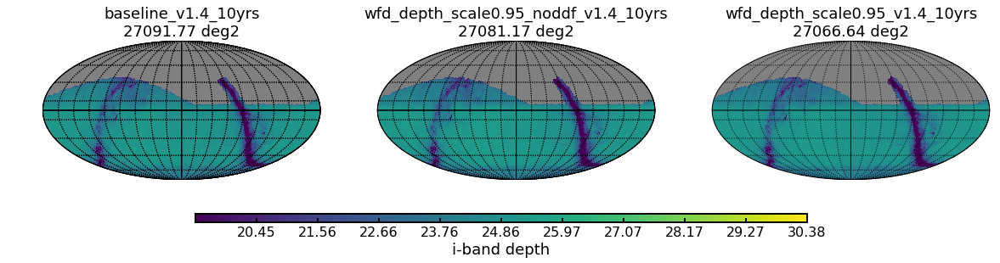

<Figure size 720x432 with 0 Axes>

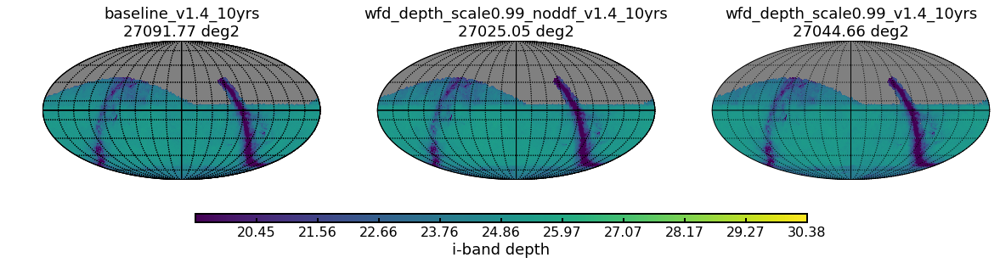

In [24]:
areas_dict = plot_things(bundle=exgal_depth_bundles, tag='nocuts', area_df=areas_dict,) # #colormin=25.7, colormax=25.9)

#### lets now implement a declination cut (where we take the min/max decs for each dbs to be that for the eg-footprint)

In [25]:
min_dec_all, max_dec_all = 200, -200

for dbname in [f for f in dbnames_base if not f.__contains__('baseline')]:
    # baseline
    eg = np.where( (depth_bundles[baseline_key].metricValues.mask == False) )[0]
    eg_ras, eg_decs = pix2radec(nside=nside, pix_num=eg)
    min_dec_all, max_dec_all = min(min_dec_all, min(eg_decs)), max(max_dec_all, max(eg_decs))
    
    # wfd-depth wo ddf
    eg = np.where( (depth_bundles[dbname].metricValues.mask == False) )[0]
    eg_ras, eg_decs = pix2radec(nside=nside, pix_num=eg)
    min_dec_all, max_dec_all = min(min_dec_all, min(eg_decs)), max(max_dec_all, max(eg_decs))
    
    # wfd-depth w/ ddf
    dbname = dbname.replace('_noddf', '')
    
    eg = np.where( (depth_bundles[dbname].metricValues.mask == False) )[0]
    eg_ras, eg_decs = pix2radec(nside=nside, pix_num=eg)
    min_dec_all, max_dec_all = min(min_dec_all, min(eg_decs)), max(max_dec_all, max(eg_decs))
    
print('across: %.2f <= dec <= %.2f' % (min_dec_all, max_dec_all))

across: -63.82 <= dec <= 6.13


In [26]:
for dbname in [f for f in dbnames_base if not f.__contains__('baseline')]:
    # baseline
    eg = np.where( (depth_bundles[baseline_key].metricValues.mask == False) )[0]
    eg_ras, eg_decs = pix2radec(nside=nside, pix_num=eg)
    min_dec, max_dec = min(eg_decs), max(eg_decs)
    print('%s: %.2f <= dec <= %.2f' % (baseline_key, min_dec, max_dec))
    
    in_survey_pixels = np.where( (exgal_depth_bundles[baseline_key].metricValues.mask == False))[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_all) & (in_survey_decs >= min_dec_all) )[0] ]
    
    exgal_depth_bundles[baseline_key].metricValues.mask[:] = True
    exgal_depth_bundles[baseline_key].metricValues.mask[wfd_pixels] = False
    
    # wfd-depth wo ddf
    eg = np.where( (depth_bundles[dbname].metricValues.mask == False) )[0]
    eg_ras, eg_decs = pix2radec(nside=nside, pix_num=eg)
    min_dec, max_dec = min(eg_decs), max(eg_decs)
    print('%s: %.2f <= dec <= %.2f' % (dbname, min_dec, max_dec))
    
    in_survey_pixels = np.where( (exgal_depth_bundles[dbname].metricValues.mask == False) )[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_all) & (in_survey_decs >= min_dec_all) )[0] ]
    
    exgal_depth_bundles[dbname].metricValues.mask[:] = True
    exgal_depth_bundles[dbname].metricValues.mask[wfd_pixels] = False
    
    # wfd-depth w/ ddf
    dbname = dbname.replace('_noddf', '')
    
    eg = np.where( (depth_bundles[dbname].metricValues.mask == False) )[0]
    eg_ras, eg_decs = pix2radec(nside=nside, pix_num=eg)
    min_dec, max_dec = min(eg_decs), max(eg_decs)
    print('%s: %.2f <= dec <= %.2f' % (dbname, min_dec, max_dec))
    
    in_survey_pixels = np.where( (exgal_depth_bundles[dbname].metricValues.mask == False))[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_all) & (in_survey_decs >= min_dec_all) )[0] ]
    
    exgal_depth_bundles[dbname].metricValues.mask[:] = True
    exgal_depth_bundles[dbname].metricValues.mask[wfd_pixels] = False
    

baseline_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.65_noddf_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.65_v1.4_10yrs: -63.64 <= dec <= 6.13
baseline_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.70_noddf_v1.4_10yrs: -63.45 <= dec <= 6.13
wfd_depth_scale0.70_v1.4_10yrs: -63.64 <= dec <= 6.13
baseline_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.75_noddf_v1.4_10yrs: -63.45 <= dec <= 6.13
wfd_depth_scale0.75_v1.4_10yrs: -63.64 <= dec <= 6.13
baseline_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.80_noddf_v1.4_10yrs: -63.45 <= dec <= 6.13
wfd_depth_scale0.80_v1.4_10yrs: -63.64 <= dec <= 6.13
baseline_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.85_noddf_v1.4_10yrs: -63.64 <= dec <= 6.13
wfd_depth_scale0.85_v1.4_10yrs: -63.64 <= dec <= 6.13
baseline_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.90_noddf_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale0.90_v1.4_10yrs: -63.64 <= dec <= 5.98
baseline_v1.4_10yrs: -63.82 <= dec <= 6.13
wfd_depth_scale

<Figure size 720x432 with 0 Axes>

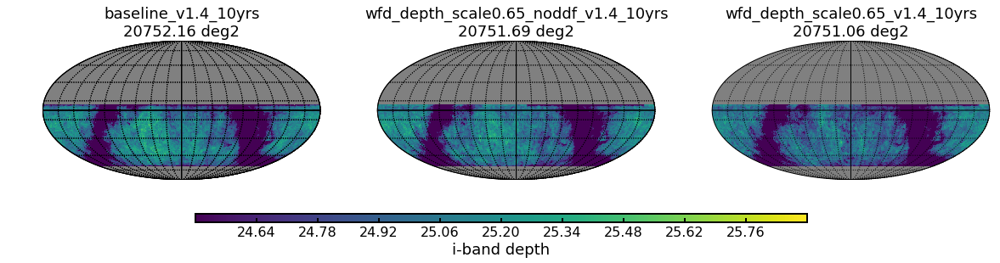

<Figure size 720x432 with 0 Axes>

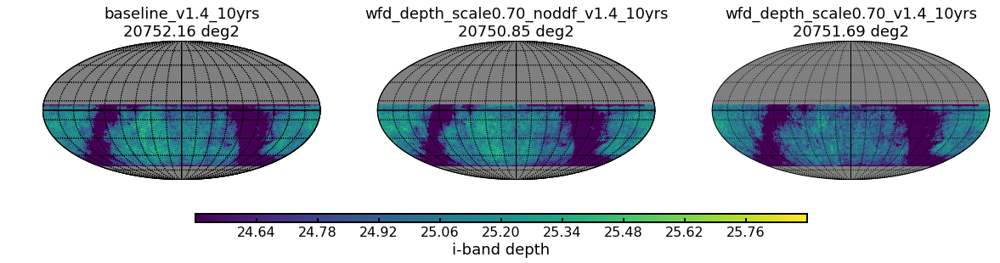

<Figure size 720x432 with 0 Axes>

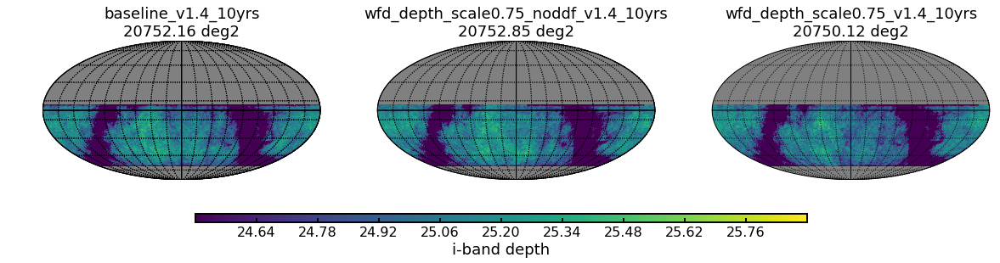

<Figure size 720x432 with 0 Axes>

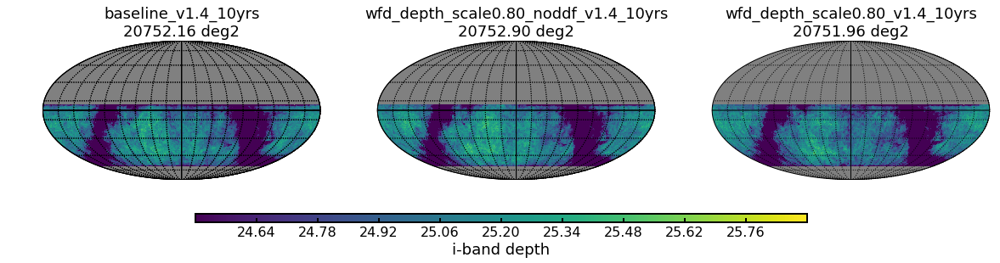

<Figure size 720x432 with 0 Axes>

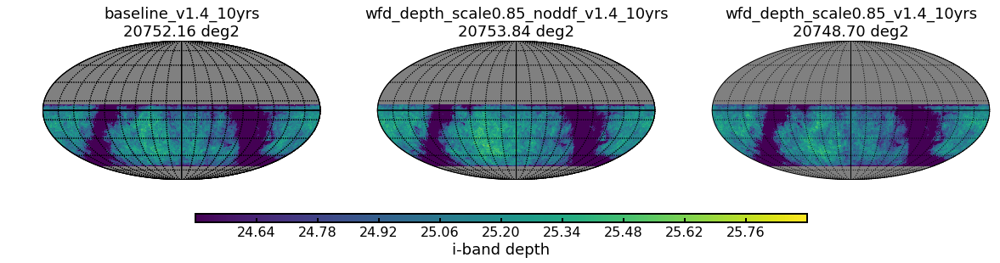

<Figure size 720x432 with 0 Axes>

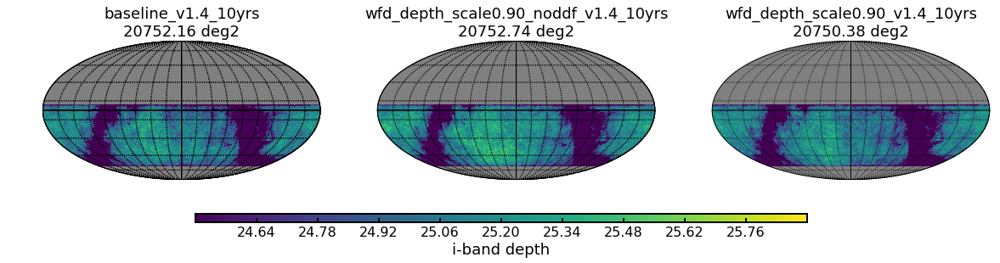

<Figure size 720x432 with 0 Axes>

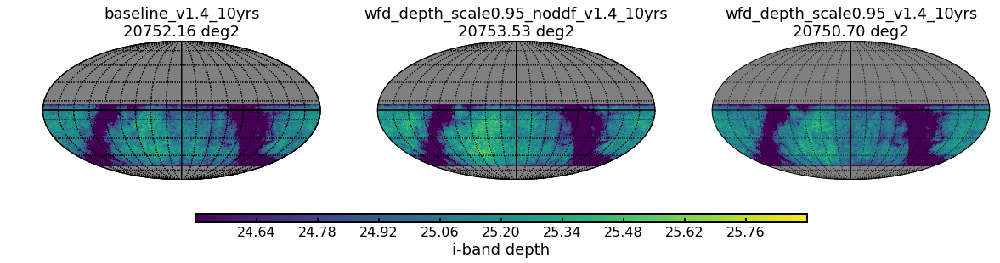

<Figure size 720x432 with 0 Axes>

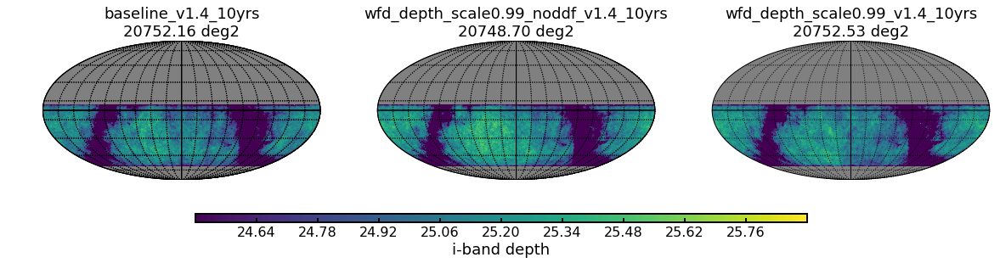

In [27]:
areas_dict = plot_things(bundle=exgal_depth_bundles, tag='dec-cuts', area_df=areas_dict, colormin=24.5, colormax=25.9)

#### now lets consider the ebv limit

In [28]:
dbdir = '/global/cscratch1/sd/awan/dbs_post_wp_v3'
dbname = 'baseline_v1.4_10yrs'
dbpath = '%s/%s.db' % (dbdir, dbname)

opsdb = db.OpsimDatabase(dbpath)
simdata = opsdb.fetchMetricData(['fieldId', 'fieldRA', 'fieldDec'],  # assume v4 outputs: fieldID in v3
                                sqlconstraint=None)
slicer = slicers.HealpixSlicer(lonCol='fieldRA', latCol='fieldDec',
                               latLonDeg=opsdb.raDecInDeg, nside=nside)
slicer.setupSlicer(simdata)

Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes


In [29]:
dustmap = maps.DustMap(nside=nside)
result = dustmap.run(slicer.slicePoints)
ebv = result['ebv']

In [30]:
for dbname in [f for f in dbnames_base if not f.__contains__('baseline')]:
    # baseline
    in_survey_pixels = np.where( (exgal_depth_bundles[baseline_key].metricValues.mask == False) &  (ebv < 0.2) )[0]
    
    exgal_depth_bundles[baseline_key].metricValues.mask[:] = True
    exgal_depth_bundles[baseline_key].metricValues.mask[in_survey_pixels] = False
    
    # wfd-depth wo ddf
    in_survey_pixels = np.where( (exgal_depth_bundles[dbname].metricValues.mask == False) &  (ebv < 0.2) )[0]
    
    exgal_depth_bundles[dbname].metricValues.mask[:] = True
    exgal_depth_bundles[dbname].metricValues.mask[in_survey_pixels] = False
    
    # wfd-depth w/ ddf
    dbname = dbname.replace('_noddf', '')
    in_survey_pixels = np.where( (exgal_depth_bundles[dbname].metricValues.mask == False) &  (ebv < 0.2) )[0]
    
    exgal_depth_bundles[dbname].metricValues.mask[:] = True
    exgal_depth_bundles[dbname].metricValues.mask[in_survey_pixels] = False

<Figure size 720x432 with 0 Axes>

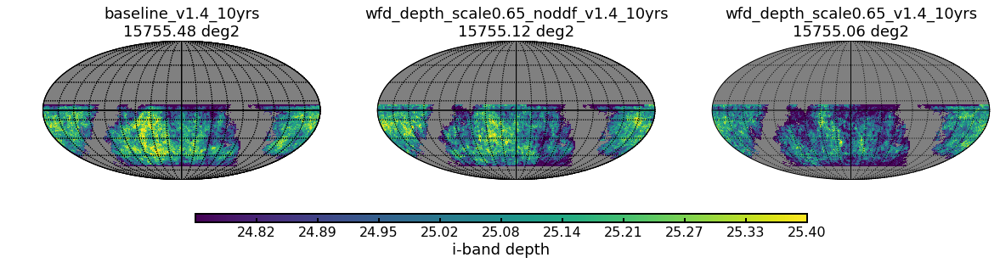

<Figure size 720x432 with 0 Axes>

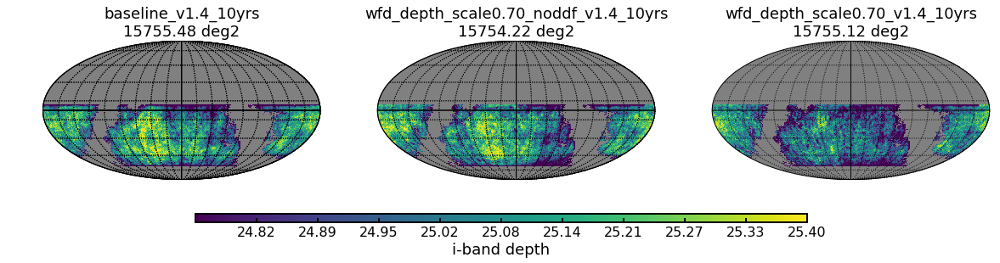

<Figure size 720x432 with 0 Axes>

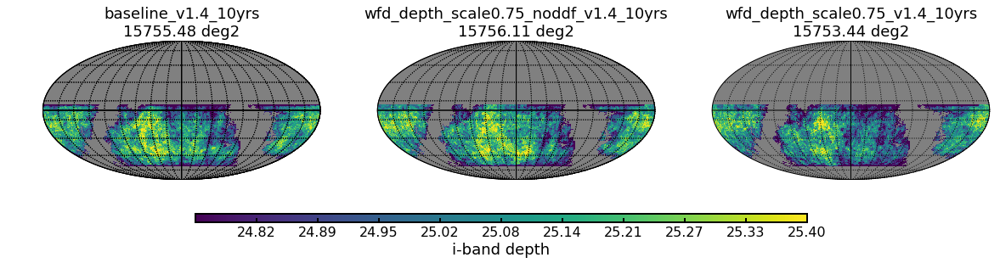

<Figure size 720x432 with 0 Axes>

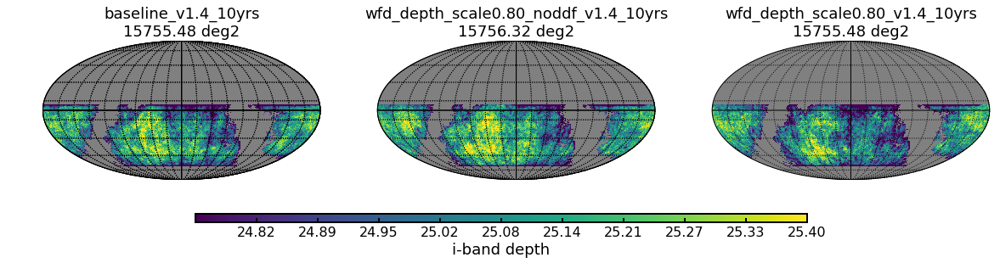

<Figure size 720x432 with 0 Axes>

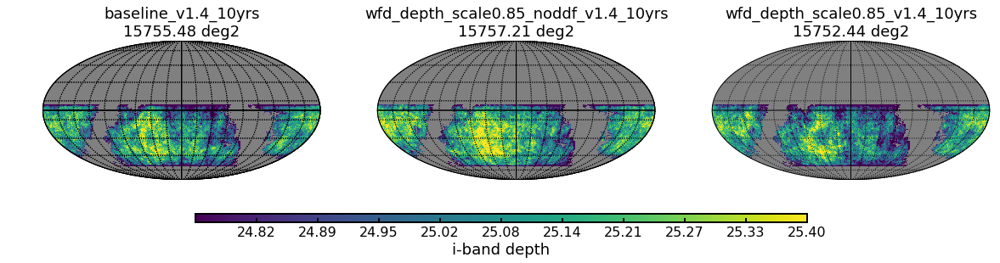

<Figure size 720x432 with 0 Axes>

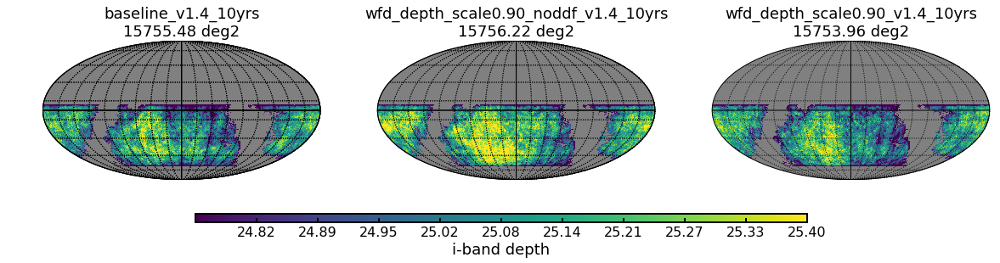

<Figure size 720x432 with 0 Axes>

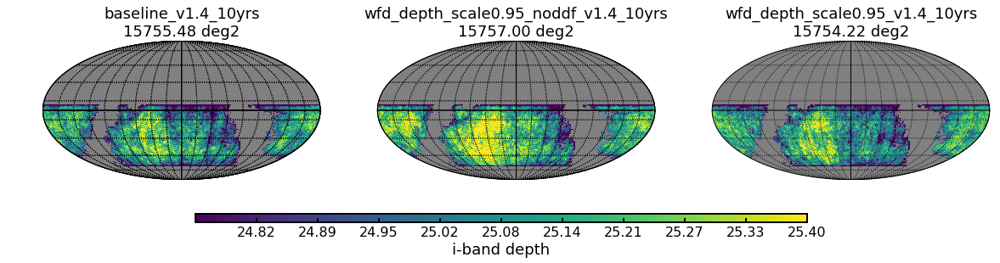

<Figure size 720x432 with 0 Axes>

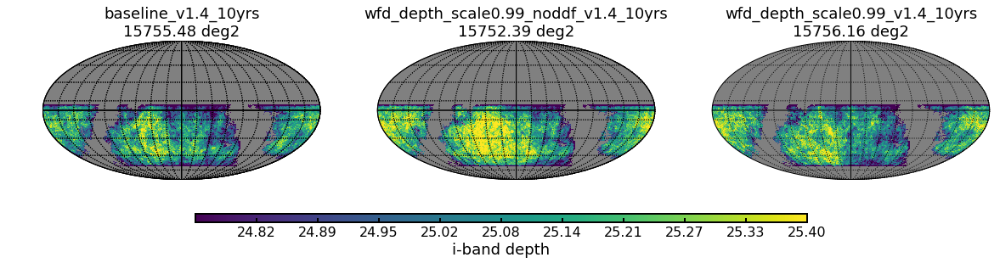

In [31]:
areas_dict = plot_things(bundle=exgal_depth_bundles, tag='ebv<0.2 + dec-cuts', area_df=areas_dict)

interesting: just the ebv + dec cuts lead to regions that are rather shallow.

### now consider the area with ebv cut and just the 6-filters constraints, and no depth cut (= limiting mag = 20)

In [32]:
depth_dir = '/global/cscratch1/sd/awan/lsst_output/post_wp_output_v1.4_-0.1cuts/wfd-depth-no-limi/bundle_data/'
exgal_noilim_depth_bundles = {}

for dbname in dbnames:
    file = [f for f in os.listdir(depth_dir) if f.__contains__('depth_in_eg_%s' % dbname) and \
                f.__contains__('i-band')
               ]
    print(file)
    
    exgal_noilim_depth_bundles[dbname] = metricBundles.createEmptyMetricBundle()
    exgal_noilim_depth_bundles[dbname].read('%s/%s' % (depth_dir, file[0]))

['depth_in_eg_wfd_depth_scale0.65_noddf_v1.4_10yrs_i-band_limi20_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.70_noddf_v1.4_10yrs_i-band_limi20_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.75_noddf_v1.4_10yrs_i-band_limi20_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.80_noddf_v1.4_10yrs_i-band_limi20_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.85_noddf_v1.4_10yrs_i-band_limi20_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in_eg_wfd_depth_scale0.90_noddf_v1.4_10yrs_i-band_limi20_nodither_nside256.npz']
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
['depth_in

<Figure size 720x432 with 0 Axes>

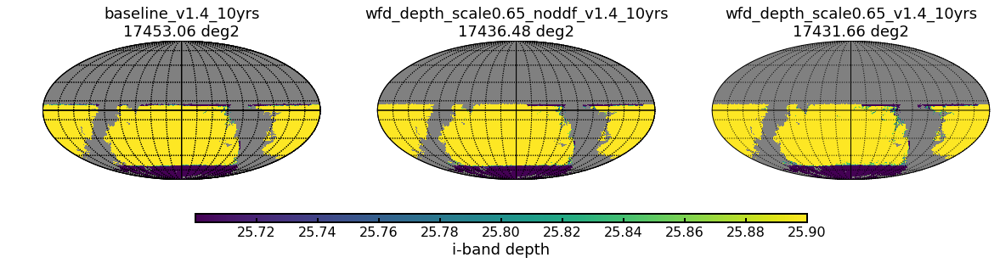

<Figure size 720x432 with 0 Axes>

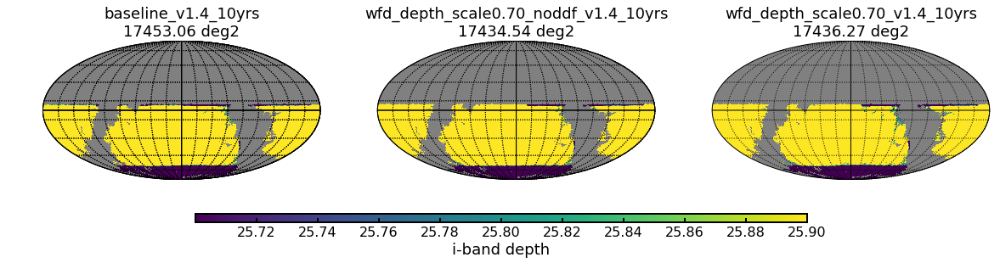

<Figure size 720x432 with 0 Axes>

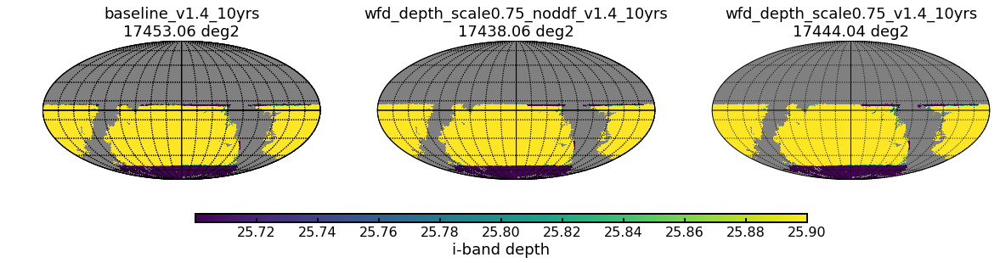

<Figure size 720x432 with 0 Axes>

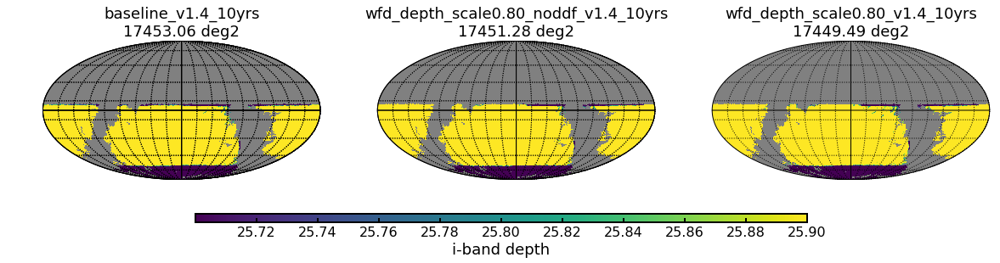

<Figure size 720x432 with 0 Axes>

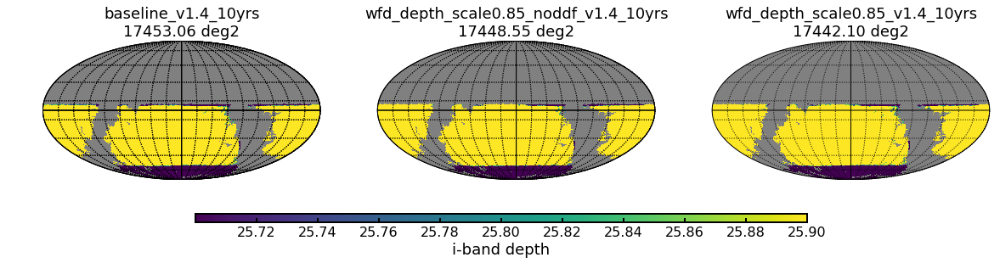

<Figure size 720x432 with 0 Axes>

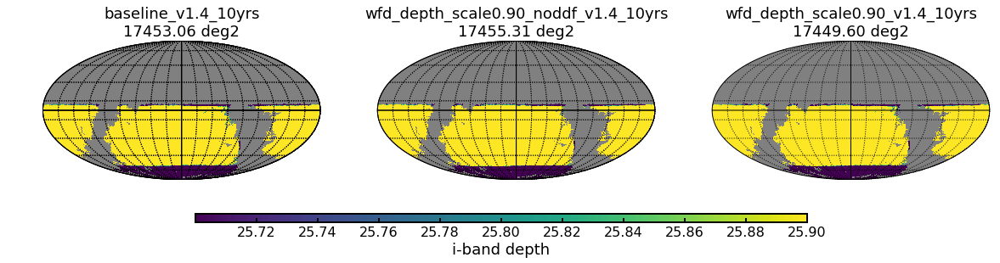

<Figure size 720x432 with 0 Axes>

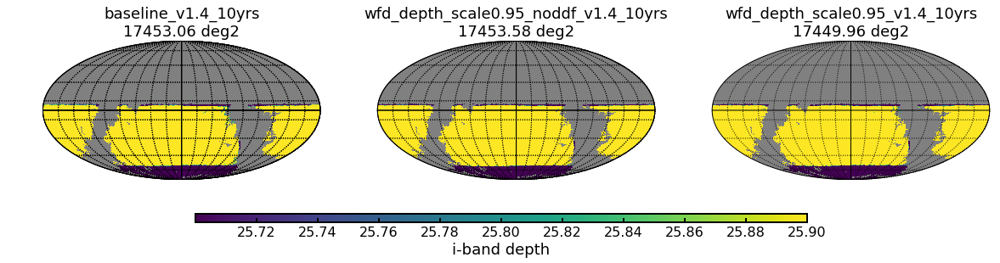

<Figure size 720x432 with 0 Axes>

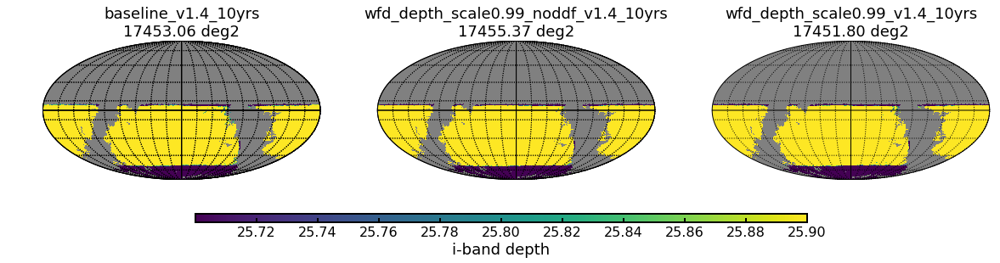

In [33]:
areas_dict = plot_things(bundle=exgal_noilim_depth_bundles, tag='ebv<0.2 + 6bands', area_df=areas_dict, colormin=25.7, colormax=25.9)

In [34]:
for dbname in [f for f in dbnames_base if not f.__contains__('baseline')]:
    # baseline
    in_survey_pixels = np.where( (exgal_noilim_depth_bundles[baseline_key].metricValues.mask == False))[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_all) & (in_survey_decs >= min_dec_all) )[0] ]
    
    exgal_noilim_depth_bundles[baseline_key].metricValues.mask[:] = True
    exgal_noilim_depth_bundles[baseline_key].metricValues.mask[wfd_pixels] = False
    
    # wfd-depth wo ddf
    in_survey_pixels = np.where( (exgal_noilim_depth_bundles[dbname].metricValues.mask == False) )[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_all) & (in_survey_decs >= min_dec_all) )[0] ]
    
    exgal_noilim_depth_bundles[dbname].metricValues.mask[:] = True
    exgal_noilim_depth_bundles[dbname].metricValues.mask[wfd_pixels] = False
    
    # wfd-depth w/ ddf
    dbname = dbname.replace('_noddf', '')

    in_survey_pixels = np.where( (exgal_noilim_depth_bundles[dbname].metricValues.mask == False))[0]
    in_survey_ras, in_survey_decs = pix2radec(nside=nside, pix_num=in_survey_pixels)
    wfd_pixels = in_survey_pixels[ np.where( (in_survey_decs <= max_dec_all) & (in_survey_decs >= min_dec_all) )[0] ]
    
    exgal_noilim_depth_bundles[dbname].metricValues.mask[:] = True
    exgal_noilim_depth_bundles[dbname].metricValues.mask[wfd_pixels] = False
    

<Figure size 720x432 with 0 Axes>

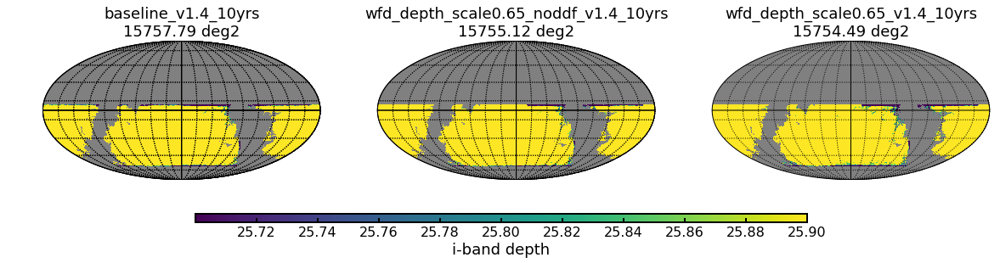

<Figure size 720x432 with 0 Axes>

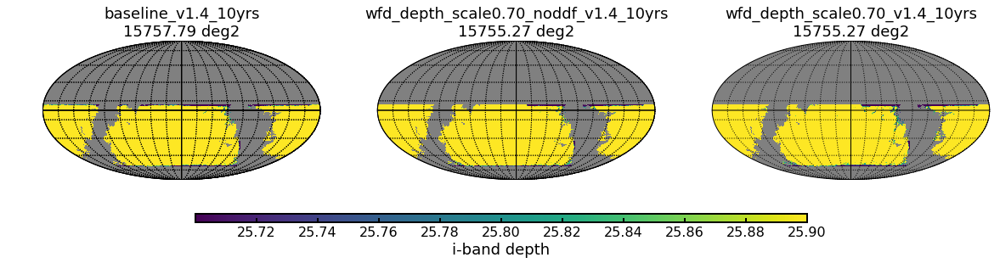

<Figure size 720x432 with 0 Axes>

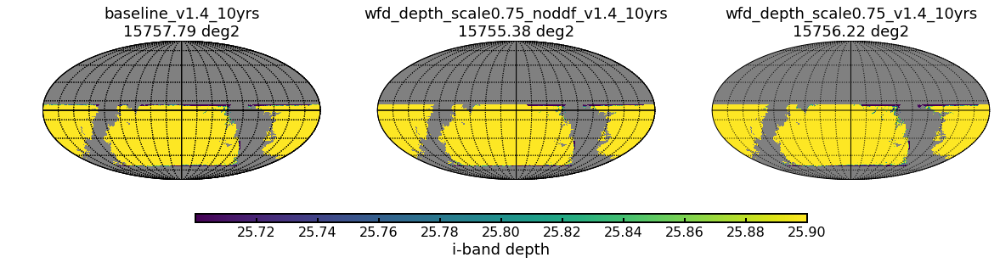

<Figure size 720x432 with 0 Axes>

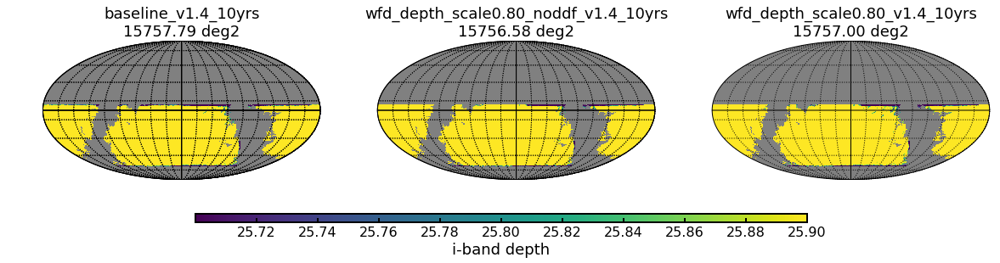

<Figure size 720x432 with 0 Axes>

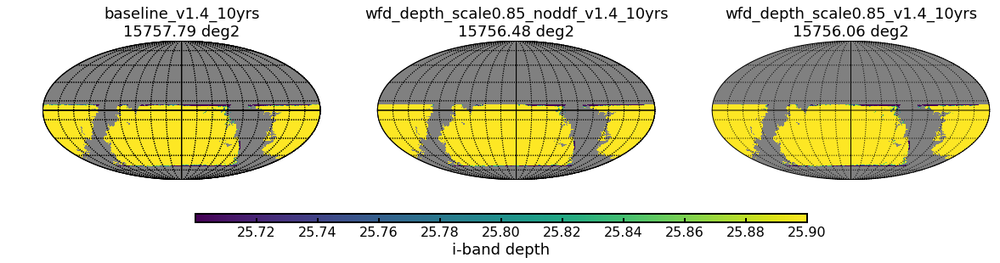

<Figure size 720x432 with 0 Axes>

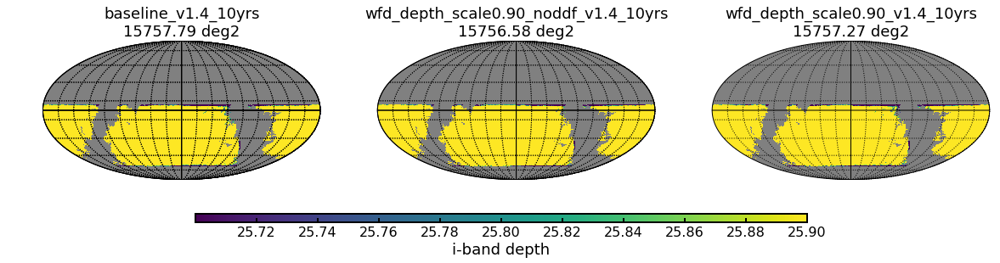

<Figure size 720x432 with 0 Axes>

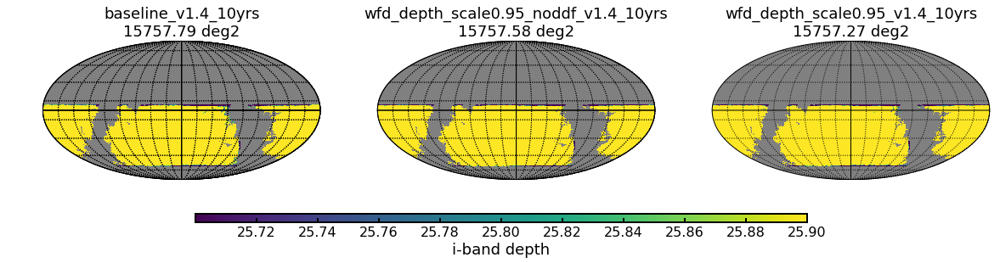

<Figure size 720x432 with 0 Axes>

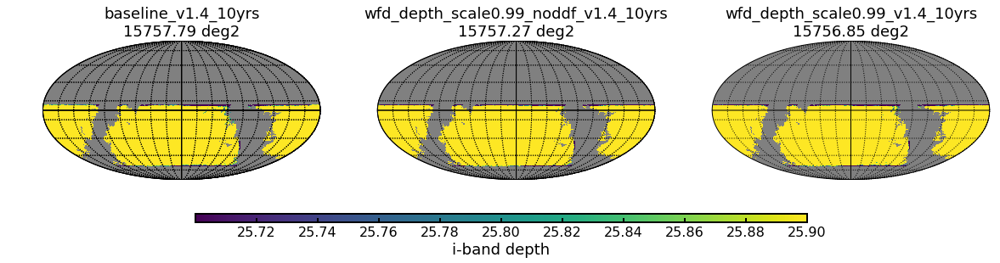

In [35]:
areas_dict = plot_things(bundle=exgal_noilim_depth_bundles, tag='ebv<0.2 + 6bands + dec-cuts', area_df=areas_dict, colormin=25.7, colormax=25.9)

In [36]:
areas_dict.keys()

Index(['dbname', 'eg', 'eg + dec-cuts', 'nocuts', 'dec-cuts',
       'ebv<0.2 + dec-cuts', 'ebv<0.2 + 6bands',
       'ebv<0.2 + 6bands + dec-cuts'],
      dtype='object')

In [37]:
print('survey area')
areas_dict = areas_dict[['dbname', 'nocuts', 'dec-cuts', 'ebv<0.2 + dec-cuts', 'ebv<0.2 + 6bands', 'ebv<0.2 + 6bands + dec-cuts', 'eg']]
areas_dict

survey area


,dbname,nocuts,dec-cuts,ebv<0.2 + dec-cuts,ebv<0.2 + 6bands,ebv<0.2 + 6bands + dec-cuts,eg
0,baseline_v1.4_10yrs,27091.769397,20752.164848,15755.482587,17453.058896,15757.790645,15048.220324
1,wfd_depth_scale0.65_v1.4_10yrs,27190.019210,20751.063275,15755.062940,17431.656908,15754.485926,14743.241995
2,wfd_depth_scale0.70_v1.4_10yrs,27177.272437,20751.692745,15755.115396,17436.273023,15755.272764,14928.830802
3,wfd_depth_scale0.75_v1.4_10yrs,27158.283419,20750.119070,15753.436809,17444.036490,15756.216969,15059.813067
4,wfd_depth_scale0.80_v1.4_10yrs,27142.651574,20751.955025,15755.482587,17449.491898,15757.003807,15149.879766
5,wfd_depth_scale0.85_v1.4_10yrs,27132.894786,20748.702762,15752.440148,17442.095623,15756.059602,15146.155401
6,wfd_depth_scale0.90_v1.4_10yrs,27099.952510,20750.381349,15753.961367,17449.596810,15757.266086,15086.775375
7,wfd_depth_scale0.95_v1.4_10yrs,27066.643044,20750.696084,15754.223647,17449.964001,15757.266086,15131.310394
8,wfd_depth_scale0.99_v1.4_10yrs,27044.664041,20752.532039,15756.164513,17451.799956,15756.846439,15142.535947
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,27199.198984,20751.692745,15755.115396,17436.482847,15755.115396,15181.143455


lets add % changes in area vs. the eg-footprint area

In [38]:
areas_dict_diff = pd.DataFrame( {'dbname' : areas_dict['dbname']} )

for key in areas_dict:
    if key not in ['dbname']:
        to_add = []
        
        for i in range(len(areas_dict[key].values)):
            if key == 'eg':
                to_add += [ '%.2f' % areas_dict['eg'].values[i] ]
                new_key = '%s (ebv<0.2 + 6bands + i>25.9)' % key
            else:
                diff = areas_dict[key].values[i] - areas_dict['eg'].values[i]
                percent = 100 * diff / areas_dict['eg'].values[i]
                to_add += ['%.2f (%.2f; %.2f%%)' % (areas_dict[key].values[i],  diff, percent) ]
                new_key = r'%s ($\Delta_{eg}$; %% diff)' % key

        areas_dict_diff[new_key] = to_add

areas_dict_diff

,dbname,nocuts ($\Delta_{eg}$; % diff),dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff),eg (ebv<0.2 + 6bands + i>25.9)
0,baseline_v1.4_10yrs,27091.77 (12043.55; 80.03%),20752.16 (5703.94; 37.90%),15755.48 (707.26; 4.70%),17453.06 (2404.84; 15.98%),15757.79 (709.57; 4.72%),15048.22
1,wfd_depth_scale0.65_v1.4_10yrs,27190.02 (12446.78; 84.42%),20751.06 (6007.82; 40.75%),15755.06 (1011.82; 6.86%),17431.66 (2688.41; 18.23%),15754.49 (1011.24; 6.86%),14743.24
2,wfd_depth_scale0.70_v1.4_10yrs,27177.27 (12248.44; 82.05%),20751.69 (5822.86; 39.00%),15755.12 (826.28; 5.53%),17436.27 (2507.44; 16.80%),15755.27 (826.44; 5.54%),14928.83
3,wfd_depth_scale0.75_v1.4_10yrs,27158.28 (12098.47; 80.34%),20750.12 (5690.31; 37.78%),15753.44 (693.62; 4.61%),17444.04 (2384.22; 15.83%),15756.22 (696.40; 4.62%),15059.81
4,wfd_depth_scale0.80_v1.4_10yrs,27142.65 (11992.77; 79.16%),20751.96 (5602.08; 36.98%),15755.48 (605.60; 4.00%),17449.49 (2299.61; 15.18%),15757.00 (607.12; 4.01%),15149.88
5,wfd_depth_scale0.85_v1.4_10yrs,27132.89 (11986.74; 79.14%),20748.70 (5602.55; 36.99%),15752.44 (606.28; 4.00%),17442.10 (2295.94; 15.16%),15756.06 (609.90; 4.03%),15146.16
6,wfd_depth_scale0.90_v1.4_10yrs,27099.95 (12013.18; 79.63%),20750.38 (5663.61; 37.54%),15753.96 (667.19; 4.42%),17449.60 (2362.82; 15.66%),15757.27 (670.49; 4.44%),15086.78
7,wfd_depth_scale0.95_v1.4_10yrs,27066.64 (11935.33; 78.88%),20750.70 (5619.39; 37.14%),15754.22 (622.91; 4.12%),17449.96 (2318.65; 15.32%),15757.27 (625.96; 4.14%),15131.31
8,wfd_depth_scale0.99_v1.4_10yrs,27044.66 (11902.13; 78.60%),20752.53 (5610.00; 37.05%),15756.16 (613.63; 4.05%),17451.80 (2309.26; 15.25%),15756.85 (614.31; 4.06%),15142.54
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,27199.20 (12018.06; 79.16%),20751.69 (5570.55; 36.69%),15755.12 (573.97; 3.78%),17436.48 (2255.34; 14.86%),15755.12 (573.97; 3.78%),15181.14


In [39]:
areas_dict_diff.keys()

Index(['dbname', 'nocuts ($\Delta_{eg}$; % diff)',
       'dec-cuts ($\Delta_{eg}$; % diff)',
       'ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff)',
       'ebv<0.2 + 6bands ($\Delta_{eg}$; % diff)',
       'ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff)',
       'eg (ebv<0.2 + 6bands + i>25.9)'],
      dtype='object')

In [40]:
areas_dict_diff[ ['dbname',
       'ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff)',
       'ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff)',
       'eg (ebv<0.2 + 6bands + i>25.9)'] ]

,dbname,ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff),eg (ebv<0.2 + 6bands + i>25.9)
0,baseline_v1.4_10yrs,15755.48 (707.26; 4.70%),15757.79 (709.57; 4.72%),15048.22
1,wfd_depth_scale0.65_v1.4_10yrs,15755.06 (1011.82; 6.86%),15754.49 (1011.24; 6.86%),14743.24
2,wfd_depth_scale0.70_v1.4_10yrs,15755.12 (826.28; 5.53%),15755.27 (826.44; 5.54%),14928.83
3,wfd_depth_scale0.75_v1.4_10yrs,15753.44 (693.62; 4.61%),15756.22 (696.40; 4.62%),15059.81
4,wfd_depth_scale0.80_v1.4_10yrs,15755.48 (605.60; 4.00%),15757.00 (607.12; 4.01%),15149.88
5,wfd_depth_scale0.85_v1.4_10yrs,15752.44 (606.28; 4.00%),15756.06 (609.90; 4.03%),15146.16
6,wfd_depth_scale0.90_v1.4_10yrs,15753.96 (667.19; 4.42%),15757.27 (670.49; 4.44%),15086.78
7,wfd_depth_scale0.95_v1.4_10yrs,15754.22 (622.91; 4.12%),15757.27 (625.96; 4.14%),15131.31
8,wfd_depth_scale0.99_v1.4_10yrs,15756.16 (613.63; 4.05%),15756.85 (614.31; 4.06%),15142.54
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,15755.12 (573.97; 3.78%),15755.12 (573.97; 3.78%),15181.14


okay .. we definitely have some room for improvement as there's quite a bit of the area that passes all cuts exept the depth cut.

#### lets look at i-band nvisits

In [41]:
 # consider only non-DD visits
sqlconstraint = 'note not like "DD%"'
sqlconstraint += ' and filter=="i"'

outdir = 'test'
resultsDb = db.ResultsDb(outDir=outdir)

nvisits_all = {}
for dbname in dbnames:
    bundles = {}
    
    dbpath = '%s/%s.db' % (dbdir, dbname)

    opsdb = db.OpsimDatabase(dbpath)
    # set up slicer
    slicer = slicers.HealpixSlicer(lonCol='fieldRA', latCol='fieldDec',
                                   latLonDeg=opsdb.raDecInDeg, nside=nside, useCache=False)
    
    # set up the counts metric
    metric = metrics.CountMetric('observationStartMJD', metricName='Nvisits')
    
    bundles['nvisits'] = metricBundles.MetricBundle(metric, slicer, sqlconstraint)
    
    # set up the group.
    grp = metricBundles.MetricBundleGroup(bundles, opsdb, outDir=outdir,
                                          resultsDb=resultsDb, saveEarly=False)
    grp.runAll()

    for key in bundles:
        nvisits_all[ dbname] = copy.deepcopy(bundles['nvisits'])

Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Querying database SummaryAllProps with constraint note not like "DD%" and filter=="i" for columns ['fieldDec', 'observationStartMJD', 'fieldRA']
Found 497080 visits
Running:  ['nvisits']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Querying database SummaryAllProps with constraint note not like "DD%" and filter=="i" for columns ['fieldDec', 'observationStartMJD', 'fieldRA']
Found 494757 visits
Running:  ['nvisits']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Querying database SummaryAllProps with constraint note not like "DD%" and filter=="i" for columns ['fieldDec', 'observationStartMJD', 'fieldRA']
Found 492121 visits
Running:  ['nvisits']
Completed metric generation

In [42]:
def get_nvisit_tot(bundle, tag, nvisits_df=None):

    if nvisits_df is None:
        nvisits_df = pd.DataFrame()
        add_to_df = False
    else:
        add_to_df = True
        
    dbs_list_noddf_ = []
    dbs_list_wddf_ = []
    nvisits_noddf_ = []
    nvisits_wddf_ = []
    
    for i, dbname in enumerate( [f for f in dbnames_base if not f.__contains__('baseline')] ):

        key = baseline_key
        in_survey_pixels = np.where( bundle[key].metricValues.mask == False )[0]

        if i == 0:
            dbs_list_wddf_.append(key)
            nvisits_wddf_.append( np.sum(nvisits_all[key].metricValues.data[in_survey_pixels]) )
        

        # now noddf
        
        key = dbname
        in_survey_pixels = np.where( bundle[key].metricValues.mask == False )[0]

        dbs_list_noddf_.append(key)
        nvisits_noddf_.append( np.sum(nvisits_all[key].metricValues.data[in_survey_pixels]) )
            

        # plot the on wddf
        dbname = dbname.replace('_noddf', '')
        key = dbname
        in_survey_pixels = np.where( bundle[key].metricValues.mask == False )[0]

        dbs_list_wddf_.append(key)
        nvisits_wddf_.append( np.sum(nvisits_all[key].metricValues.data[in_survey_pixels]) )

       
    if not add_to_df:
        nvisits_df['dbname'] = dbs_list_wddf_ + dbs_list_noddf_
        
    nvisits_df[tag] = nvisits_wddf_ + nvisits_noddf_
        
    #return to_print1, to_print2, area_df
    return nvisits_df

In [43]:
nvisits_dict = get_nvisit_tot(bundle=exgal_depth_bundles, tag='ebv<0.2 + dec-cuts', nvisits_df=None)

In [44]:
nvisits_dict = get_nvisit_tot(bundle=exgal_noilim_depth_bundles, tag='ebv<0.2 + 6bands + dec-cuts', nvisits_df=nvisits_dict)

In [45]:
nvisits_dict = get_nvisit_tot(bundle=depth_bundles, tag='eg + dec-cuts', nvisits_df=nvisits_dict)

In [46]:
nvisits_dict

,dbname,ebv<0.2 + dec-cuts,ebv<0.2 + 6bands + dec-cuts,eg + dec-cuts
0,baseline_v1.4_10yrs,58113072.0,58113572.0,56508539.0
1,wfd_depth_scale0.65_v1.4_10yrs,48211225.0,48201458.0,45522223.0
2,wfd_depth_scale0.70_v1.4_10yrs,49999168.0,49991938.0,47783686.0
3,wfd_depth_scale0.75_v1.4_10yrs,51881831.0,51878449.0,50038458.0
4,wfd_depth_scale0.80_v1.4_10yrs,53922369.0,53921468.0,52320155.0
5,wfd_depth_scale0.85_v1.4_10yrs,56200605.0,56202068.0,54672216.0
6,wfd_depth_scale0.90_v1.4_10yrs,58211792.0,58213035.0,56733507.0
7,wfd_depth_scale0.95_v1.4_10yrs,60749660.0,60750915.0,59537961.0
8,wfd_depth_scale0.99_v1.4_10yrs,62925849.0,62926259.0,61764414.0
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,53537124.0,53529993.0,52003693.0


In [47]:
nvisits_dict_diff = pd.DataFrame( {'dbname' : areas_dict['dbname']} )

for key in nvisits_dict:
    if key not in ['dbname']:
        to_add = []
        
        for i in range(len(nvisits_dict[key].values)):
            if key == 'eg':
                to_add += [ '%.3e' % nvisits_dict['eg'].values[i] ]
                new_key = '%s (ebv<0.2 + 6bands + i>25.9)' % key
            else:
                diff = nvisits_dict[key].values[i] - nvisits_dict['eg + dec-cuts'].values[i]
                percent = 100 * diff / nvisits_dict['eg + dec-cuts'].values[i]
                to_add += ['%.3e (%.3e; %.2f%%)' % (nvisits_dict[key].values[i],  diff, percent) ]
                new_key = r'%s ($\Delta_{eg}$; %% diff)' % key

        nvisits_dict_diff[new_key] = to_add

nvisits_dict_diff

,dbname,ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff),eg + dec-cuts ($\Delta_{eg}$; % diff)
0,baseline_v1.4_10yrs,5.811e+07 (1.605e+06; 2.84%),5.811e+07 (1.605e+06; 2.84%),5.651e+07 (0.000e+00; 0.00%)
1,wfd_depth_scale0.65_v1.4_10yrs,4.821e+07 (2.689e+06; 5.91%),4.820e+07 (2.679e+06; 5.89%),4.552e+07 (0.000e+00; 0.00%)
2,wfd_depth_scale0.70_v1.4_10yrs,5.000e+07 (2.215e+06; 4.64%),4.999e+07 (2.208e+06; 4.62%),4.778e+07 (0.000e+00; 0.00%)
3,wfd_depth_scale0.75_v1.4_10yrs,5.188e+07 (1.843e+06; 3.68%),5.188e+07 (1.840e+06; 3.68%),5.004e+07 (0.000e+00; 0.00%)
4,wfd_depth_scale0.80_v1.4_10yrs,5.392e+07 (1.602e+06; 3.06%),5.392e+07 (1.601e+06; 3.06%),5.232e+07 (0.000e+00; 0.00%)
5,wfd_depth_scale0.85_v1.4_10yrs,5.620e+07 (1.528e+06; 2.80%),5.620e+07 (1.530e+06; 2.80%),5.467e+07 (0.000e+00; 0.00%)
6,wfd_depth_scale0.90_v1.4_10yrs,5.821e+07 (1.478e+06; 2.61%),5.821e+07 (1.480e+06; 2.61%),5.673e+07 (0.000e+00; 0.00%)
7,wfd_depth_scale0.95_v1.4_10yrs,6.075e+07 (1.212e+06; 2.04%),6.075e+07 (1.213e+06; 2.04%),5.954e+07 (0.000e+00; 0.00%)
8,wfd_depth_scale0.99_v1.4_10yrs,6.293e+07 (1.161e+06; 1.88%),6.293e+07 (1.162e+06; 1.88%),6.176e+07 (0.000e+00; 0.00%)
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,5.354e+07 (1.533e+06; 2.95%),5.353e+07 (1.526e+06; 2.93%),5.200e+07 (0.000e+00; 0.00%)


okay without the depth cut, nvisits are monotonic

#### look at depth statistics

In [48]:
def get_stat_depth(bundle, tag, stat='median', stat_depth_df=None):
    
    if stat not in ['median', 'mean', 'min', 'max']:
        raise ValueError('invalid stat requested')

    if stat_depth_df is None:
        stat_depth_df = pd.DataFrame()
        add_to_df = False
    else:
        add_to_df = True
        
    dbs_list_noddf_ = []
    dbs_list_wddf_ = []
    stat_noddf_ = []
    stat_wddf_ = []
    
    for i, dbname in enumerate( [f for f in dbnames_base if not f.__contains__('baseline')] ):

        key = baseline_key
        in_survey_pixels = np.where( bundle[key].metricValues.mask == False )[0]

        if i == 0:
            dbs_list_wddf_.append(key)
            if stat == 'median':
                stat_val = np.median(bundle[key].metricValues.data[in_survey_pixels])
            elif stat == 'mean':
                stat_val = np.mean(bundle[key].metricValues.data[in_survey_pixels])
            elif stat == 'min':
                stat_val = np.min(bundle[key].metricValues.data[in_survey_pixels])
            elif stat == 'max':
                stat_val = np.max(bundle[key].metricValues.data[in_survey_pixels])
            else:
                raise ValueError('somethings wrong.')
            stat_wddf_.append( stat_val )
        
        # now noddf
        key = dbname
        in_survey_pixels = np.where( bundle[key].metricValues.mask == False )[0]

        
        if stat == 'median':
            stat_val = np.median(bundle[key].metricValues.data[in_survey_pixels])
        elif stat == 'mean':
            stat_val = np.mean(bundle[key].metricValues.data[in_survey_pixels])
        elif stat == 'min':
            stat_val = np.min(bundle[key].metricValues.data[in_survey_pixels])
        elif stat == 'max':
            stat_val = np.max(bundle[key].metricValues.data[in_survey_pixels])
        else:
            raise ValueError('somethings wrong.')
            
        dbs_list_noddf_.append(key)
        stat_noddf_.append( stat_val )
        

        # now consider wddf
        dbname = dbname.replace('_noddf', '')
        key = dbname
        in_survey_pixels = np.where( bundle[key].metricValues.mask == False )[0]

        if stat == 'median':
            stat_val = np.median(bundle[key].metricValues.data[in_survey_pixels])
        elif stat == 'mean':
            stat_val = np.mean(bundle[key].metricValues.data[in_survey_pixels])
        elif stat == 'min':
            stat_val = np.min(bundle[key].metricValues.data[in_survey_pixels])
        elif stat == 'max':
            stat_val = np.max(bundle[key].metricValues.data[in_survey_pixels])
        else:
            raise ValueError('somethings wrong.')
        
        dbs_list_wddf_.append(key)
        stat_wddf_.append( stat_val )

       
    if not add_to_df:
        stat_depth_df['dbname'] = dbs_list_wddf_ + dbs_list_noddf_
        
    stat_depth_df[tag] = stat_wddf_ + stat_noddf_

    return stat_depth_df

In [49]:
stat = 'median'
median_depth_dict = get_stat_depth(bundle=exgal_depth_bundles, tag='ebv<0.2 + dec-cuts', stat_depth_df=None, stat=stat)

In [50]:
median_depth_dict = get_stat_depth(bundle=exgal_noilim_depth_bundles, tag='ebv<0.2 + 6bands + dec-cuts', stat_depth_df=median_depth_dict, stat=stat)

In [51]:
median_depth_dict = get_stat_depth(bundle=depth_bundles, tag='eg + dec-cuts', stat_depth_df=median_depth_dict, stat=stat)

In [52]:
print('%s depth' % stat)
median_depth_dict

median depth


,dbname,ebv<0.2 + dec-cuts,ebv<0.2 + 6bands + dec-cuts,eg + dec-cuts
0,baseline_v1.4_10yrs,25.079082,26.284047,26.292061
1,wfd_depth_scale0.65_v1.4_10yrs,24.971225,26.162978,26.173507
2,wfd_depth_scale0.70_v1.4_10yrs,24.978283,26.189761,26.198728
3,wfd_depth_scale0.75_v1.4_10yrs,25.028366,26.211249,26.218643
4,wfd_depth_scale0.80_v1.4_10yrs,25.041917,26.234972,26.241709
5,wfd_depth_scale0.85_v1.4_10yrs,25.053700,26.256945,26.263603
6,wfd_depth_scale0.90_v1.4_10yrs,25.073506,26.284593,26.291812
7,wfd_depth_scale0.95_v1.4_10yrs,25.083896,26.303304,26.309881
8,wfd_depth_scale0.99_v1.4_10yrs,25.105864,26.334921,26.341885
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,25.051175,26.241832,26.248312


In [53]:
median_depth_dict_diff = pd.DataFrame( {'dbname' : median_depth_dict['dbname']} )

for key in median_depth_dict:
    if key not in ['dbname']:
        to_add = []
        
        for i in range(len(median_depth_dict[key].values)):
            if key == 'eg':
                to_add += [ '%.2f' % median_depth_dict['eg'].values[i] ]
                new_key = '%s (ebv<0.2 + 6bands + i>25.9)' % key
            else:
                diff = median_depth_dict[key].values[i] - median_depth_dict['eg + dec-cuts'].values[i]
                percent = 100 * diff / median_depth_dict['eg + dec-cuts'].values[i]
                to_add += ['%.2f (%.2f; %.2f%%)' % (median_depth_dict[key].values[i],  diff, percent) ]
                new_key = r'%s ($\Delta_{eg}$; %% diff)' % key

        median_depth_dict_diff[new_key] = to_add

print('%s depth' % stat)
median_depth_dict_diff

median depth


,dbname,ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff),eg + dec-cuts ($\Delta_{eg}$; % diff)
0,baseline_v1.4_10yrs,25.08 (-1.21; -4.61%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
1,wfd_depth_scale0.65_v1.4_10yrs,24.97 (-1.20; -4.59%),26.16 (-0.01; -0.04%),26.17 (0.00; 0.00%)
2,wfd_depth_scale0.70_v1.4_10yrs,24.98 (-1.22; -4.66%),26.19 (-0.01; -0.03%),26.20 (0.00; 0.00%)
3,wfd_depth_scale0.75_v1.4_10yrs,25.03 (-1.19; -4.54%),26.21 (-0.01; -0.03%),26.22 (0.00; 0.00%)
4,wfd_depth_scale0.80_v1.4_10yrs,25.04 (-1.20; -4.57%),26.23 (-0.01; -0.03%),26.24 (0.00; 0.00%)
5,wfd_depth_scale0.85_v1.4_10yrs,25.05 (-1.21; -4.61%),26.26 (-0.01; -0.03%),26.26 (0.00; 0.00%)
6,wfd_depth_scale0.90_v1.4_10yrs,25.07 (-1.22; -4.63%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
7,wfd_depth_scale0.95_v1.4_10yrs,25.08 (-1.23; -4.66%),26.30 (-0.01; -0.02%),26.31 (0.00; 0.00%)
8,wfd_depth_scale0.99_v1.4_10yrs,25.11 (-1.24; -4.69%),26.33 (-0.01; -0.03%),26.34 (0.00; 0.00%)
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,25.05 (-1.20; -4.56%),26.24 (-0.01; -0.02%),26.25 (0.00; 0.00%)


In [54]:
stat = 'min'
min_depth_dict = get_stat_depth(bundle=exgal_depth_bundles, tag='ebv<0.2 + dec-cuts', stat_depth_df=None, stat=stat)
min_depth_dict = get_stat_depth(bundle=exgal_noilim_depth_bundles, tag='ebv<0.2 + 6bands + dec-cuts', stat_depth_df=min_depth_dict)
min_depth_dict = get_stat_depth(bundle=depth_bundles, tag='eg + dec-cuts', stat_depth_df=min_depth_dict)

In [55]:
stat = 'max'
max_depth_dict = get_stat_depth(bundle=exgal_depth_bundles, tag='ebv<0.2 + dec-cuts', stat_depth_df=None, stat=stat)
max_depth_dict = get_stat_depth(bundle=exgal_noilim_depth_bundles, tag='ebv<0.2 + 6bands + dec-cuts', stat_depth_df=max_depth_dict)
max_depth_dict = get_stat_depth(bundle=depth_bundles, tag='eg + dec-cuts', stat_depth_df=max_depth_dict)

In [56]:
stat = 'mean'
mean_depth_dict = get_stat_depth(bundle=exgal_depth_bundles, tag='ebv<0.2 + dec-cuts', stat_depth_df=None, stat=stat)
mean_depth_dict = get_stat_depth(bundle=exgal_noilim_depth_bundles, tag='ebv<0.2 + 6bands + dec-cuts', stat_depth_df=mean_depth_dict)
mean_depth_dict = get_stat_depth(bundle=depth_bundles, tag='eg + dec-cuts', stat_depth_df=mean_depth_dict)

In [57]:
dict_here = min_depth_dict
min_depth_dict_diff = pd.DataFrame( {'dbname' : dict_here['dbname']} )

for key in dict_here:
    if key not in ['dbname']:
        to_add = []
        
        for i in range(len(dict_here[key].values)):
            if key == 'eg':
                to_add += [ '%.2f' % dict_here['eg'].values[i] ]
                new_key = '%s (ebv<0.2 + 6bands + i>25.9)' % key
            else:
                diff = dict_here[key].values[i] - dict_here['eg + dec-cuts'].values[i]
                percent = 100 * diff / dict_here['eg + dec-cuts'].values[i]
                to_add += ['%.2f (%.2f; %.2f%%)' % (dict_here[key].values[i],  diff, percent) ]
                new_key = r'%s ($\Delta_{eg}$; %% diff)' % key

        min_depth_dict_diff[new_key] = to_add
print('min depth')
min_depth_dict_diff

min depth


,dbname,ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff),eg + dec-cuts ($\Delta_{eg}$; % diff)
0,baseline_v1.4_10yrs,21.42 (-4.87; -18.54%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
1,wfd_depth_scale0.65_v1.4_10yrs,21.58 (-4.59; -17.55%),26.16 (-0.01; -0.04%),26.17 (0.00; 0.00%)
2,wfd_depth_scale0.70_v1.4_10yrs,22.07 (-4.13; -15.76%),26.19 (-0.01; -0.03%),26.20 (0.00; 0.00%)
3,wfd_depth_scale0.75_v1.4_10yrs,22.22 (-4.00; -15.26%),26.21 (-0.01; -0.03%),26.22 (0.00; 0.00%)
4,wfd_depth_scale0.80_v1.4_10yrs,21.94 (-4.31; -16.41%),26.23 (-0.01; -0.03%),26.24 (0.00; 0.00%)
5,wfd_depth_scale0.85_v1.4_10yrs,22.41 (-3.85; -14.65%),26.26 (-0.01; -0.03%),26.26 (0.00; 0.00%)
6,wfd_depth_scale0.90_v1.4_10yrs,21.77 (-4.52; -17.19%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
7,wfd_depth_scale0.95_v1.4_10yrs,21.75 (-4.56; -17.33%),26.30 (-0.01; -0.02%),26.31 (0.00; 0.00%)
8,wfd_depth_scale0.99_v1.4_10yrs,22.09 (-4.25; -16.14%),26.33 (-0.01; -0.03%),26.34 (0.00; 0.00%)
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,22.13 (-4.12; -15.68%),26.24 (-0.01; -0.02%),26.25 (0.00; 0.00%)


In [58]:
dict_here = max_depth_dict
max_depth_dict_diff = pd.DataFrame( {'dbname' : dict_here['dbname']} )

for key in dict_here:
    if key not in ['dbname']:
        to_add = []
        
        for i in range(len(dict_here[key].values)):
            if key == 'eg':
                to_add += [ '%.2f' % dict_here['eg'].values[i] ]
                new_key = '%s (ebv<0.2 + 6bands + i>25.9)' % key
            else:
                diff = dict_here[key].values[i] - dict_here['eg + dec-cuts'].values[i]
                percent = 100 * diff / dict_here['eg + dec-cuts'].values[i]
                to_add += ['%.2f (%.2f; %.2f%%)' % (dict_here[key].values[i],  diff, percent) ]
                new_key = r'%s ($\Delta_{eg}$; %% diff)' % key

        max_depth_dict_diff[new_key] = to_add

print('max depth')
max_depth_dict_diff

max depth


,dbname,ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff),eg + dec-cuts ($\Delta_{eg}$; % diff)
0,baseline_v1.4_10yrs,25.60 (-0.69; -2.62%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
1,wfd_depth_scale0.65_v1.4_10yrs,25.49 (-0.68; -2.61%),26.16 (-0.01; -0.04%),26.17 (0.00; 0.00%)
2,wfd_depth_scale0.70_v1.4_10yrs,25.53 (-0.67; -2.56%),26.19 (-0.01; -0.03%),26.20 (0.00; 0.00%)
3,wfd_depth_scale0.75_v1.4_10yrs,25.63 (-0.59; -2.23%),26.21 (-0.01; -0.03%),26.22 (0.00; 0.00%)
4,wfd_depth_scale0.80_v1.4_10yrs,25.62 (-0.62; -2.38%),26.23 (-0.01; -0.03%),26.24 (0.00; 0.00%)
5,wfd_depth_scale0.85_v1.4_10yrs,25.60 (-0.66; -2.53%),26.26 (-0.01; -0.03%),26.26 (0.00; 0.00%)
6,wfd_depth_scale0.90_v1.4_10yrs,25.57 (-0.73; -2.76%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
7,wfd_depth_scale0.95_v1.4_10yrs,25.57 (-0.74; -2.82%),26.30 (-0.01; -0.02%),26.31 (0.00; 0.00%)
8,wfd_depth_scale0.99_v1.4_10yrs,25.60 (-0.74; -2.82%),26.33 (-0.01; -0.03%),26.34 (0.00; 0.00%)
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,25.56 (-0.69; -2.64%),26.24 (-0.01; -0.02%),26.25 (0.00; 0.00%)


In [59]:
dict_here = mean_depth_dict
mean_depth_dict_diff = pd.DataFrame( {'dbname' : dict_here['dbname']} )

for key in dict_here:
    if key not in ['dbname']:
        to_add = []
        
        for i in range(len(dict_here[key].values)):
            if key == 'eg':
                to_add += [ '%.2f' % dict_here['eg'].values[i] ]
                new_key = '%s (ebv<0.2 + 6bands + i>25.9)' % key
            else:
                diff = dict_here[key].values[i] - dict_here['eg + dec-cuts'].values[i]
                percent = 100 * diff / dict_here['eg + dec-cuts'].values[i]
                to_add += ['%.2f (%.2f; %.2f%%)' % (dict_here[key].values[i],  diff, percent) ]
                new_key = r'%s ($\Delta_{eg}$; %% diff)' % key

        mean_depth_dict_diff[new_key] = to_add

print('mean depth')
mean_depth_dict_diff

mean depth


,dbname,ebv<0.2 + dec-cuts ($\Delta_{eg}$; % diff),ebv<0.2 + 6bands + dec-cuts ($\Delta_{eg}$; % diff),eg + dec-cuts ($\Delta_{eg}$; % diff)
0,baseline_v1.4_10yrs,25.05 (-1.25; -4.74%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
1,wfd_depth_scale0.65_v1.4_10yrs,24.95 (-1.23; -4.69%),26.16 (-0.01; -0.04%),26.17 (0.00; 0.00%)
2,wfd_depth_scale0.70_v1.4_10yrs,24.96 (-1.24; -4.75%),26.19 (-0.01; -0.03%),26.20 (0.00; 0.00%)
3,wfd_depth_scale0.75_v1.4_10yrs,25.00 (-1.21; -4.63%),26.21 (-0.01; -0.03%),26.22 (0.00; 0.00%)
4,wfd_depth_scale0.80_v1.4_10yrs,25.02 (-1.22; -4.66%),26.23 (-0.01; -0.03%),26.24 (0.00; 0.00%)
5,wfd_depth_scale0.85_v1.4_10yrs,25.03 (-1.23; -4.70%),26.26 (-0.01; -0.03%),26.26 (0.00; 0.00%)
6,wfd_depth_scale0.90_v1.4_10yrs,25.04 (-1.25; -4.75%),26.28 (-0.01; -0.03%),26.29 (0.00; 0.00%)
7,wfd_depth_scale0.95_v1.4_10yrs,25.05 (-1.26; -4.78%),26.30 (-0.01; -0.02%),26.31 (0.00; 0.00%)
8,wfd_depth_scale0.99_v1.4_10yrs,25.07 (-1.27; -4.82%),26.33 (-0.01; -0.03%),26.34 (0.00; 0.00%)
9,wfd_depth_scale0.65_noddf_v1.4_10yrs,25.02 (-1.22; -4.66%),26.24 (-0.01; -0.02%),26.25 (0.00; 0.00%)


okay without the depth cut, depth stats are monotonic